# Load the data

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the CSV file
df = pd.read_csv("data/1.5k_cleaned_data.csv", encoding="utf-8")

# Display the first few rows to verify the data
print("First few rows of the dataset:")
print("\nRenaming columns:")
df = df.rename(
    columns={
        "stock__share_type__company__industry__industry_group__sector__name": "sector",
        "stock__share_type__company__country__code": "country",
        "stock__share_type__company__name": "company",
    }
)
df.head()

print("\nShape of the dataset:")
print(df.shape)
print(df.columns)

First few rows of the dataset:

Renaming columns:

Shape of the dataset:
(1975, 18)
Index(['stock__ticker', 'company', 'sector', 'country', 'date', 'quality',
       'growth', 'value', 'dividend', 'market_cap_usd', 'enterprise_value_usd',
       'volume', 'profit_1m', 'profit_3m', 'profit_6m', 'profit_1y',
       'profit_2y', 'profit_5y'],
      dtype='object')


# Correlations

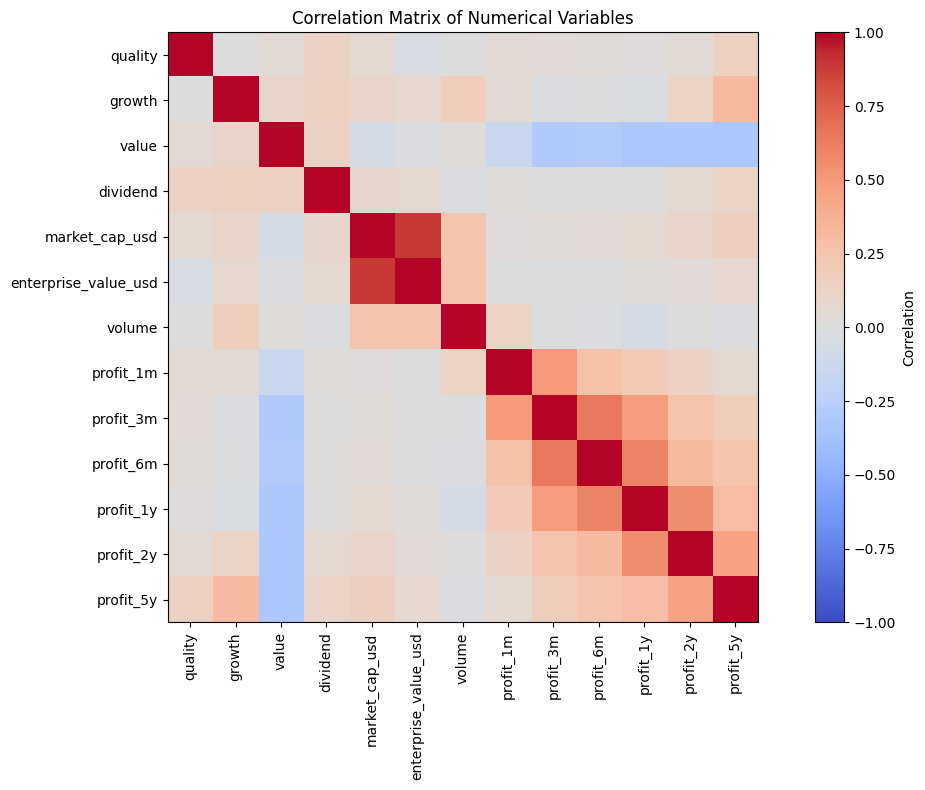

In [2]:
# Lets look for correlations between the variables
# Create a correlation matrix with only numerical columns
df_numeric = df.select_dtypes(include=["float64", "int64"])
correlation_matrix = df_numeric.corr()

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(12, 8))
plt.imshow(correlation_matrix, cmap="coolwarm", vmin=-1, vmax=1)
plt.colorbar(label="Correlation")
plt.xticks(
    range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90
)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.title("Correlation Matrix of Numerical Variables")
plt.tight_layout()
plt.show()

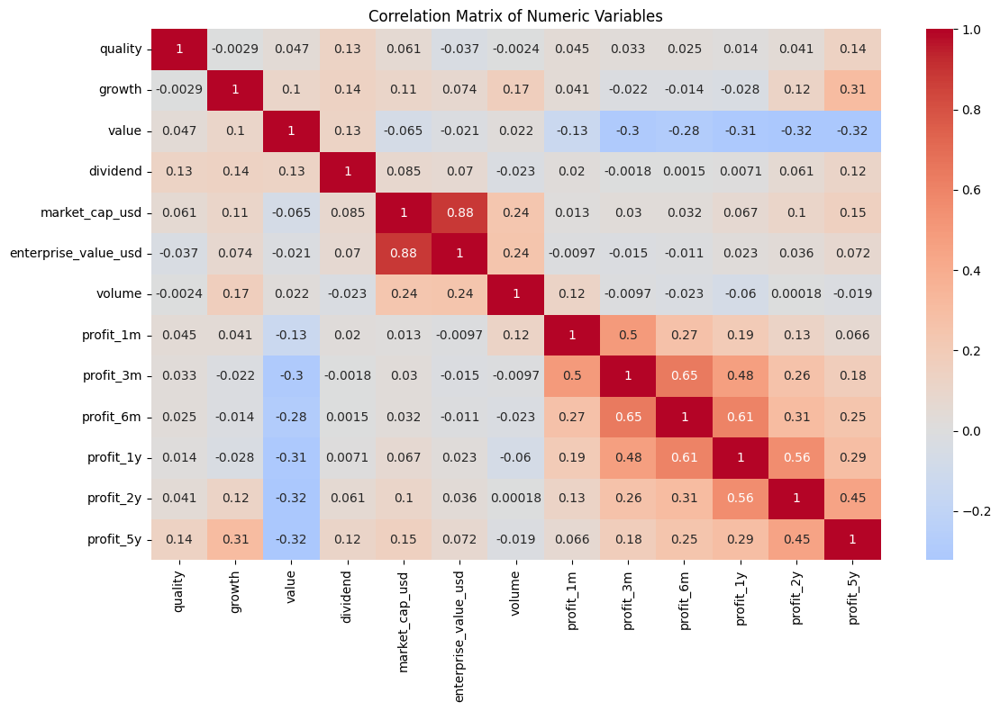

In [3]:
# Select only numeric columns
scores = [
    "quality",
    "growth",
    "value",
    "dividend",
    "market_cap_usd",
    "enterprise_value_usd",
    "volume",
    "profit_1m",
    "profit_3m",
    "profit_6m",
    "profit_1y",
    "profit_2y",
    "profit_5y",
]

# Create correlation matrix using numeric columns only
df_numeric = df[scores]
correlation_matrix = df_numeric.corr()

# Plot using seaborn for better visualization
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", center=0)
plt.title("Correlation Matrix of Numeric Variables")
plt.tight_layout()
plt.show()

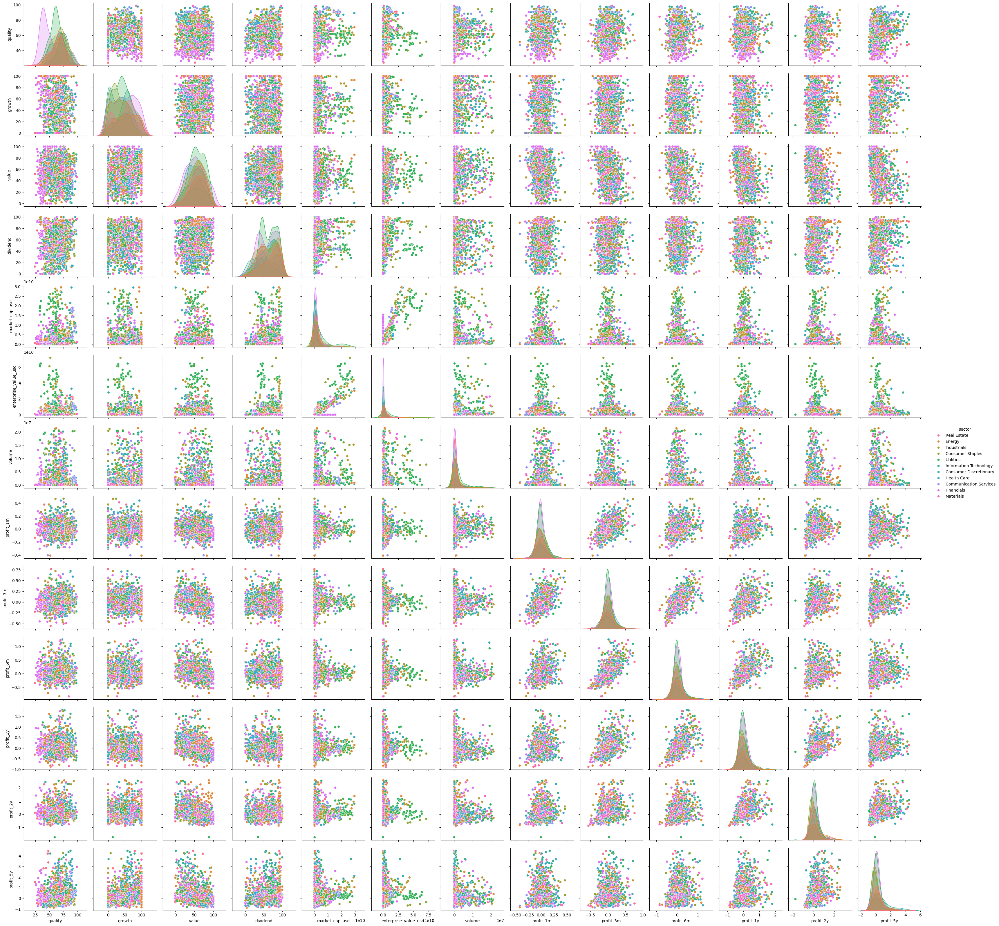

In [4]:
# for target_profit in [
#     "profit_1m",
#     "profit_3m",
#     "profit_6m",
#     "profit_1y",
#     "profit_2y",
#     "profit_5y",
# ]:
#     scores = [
#         "quality",
#         "growth",
#         "value",
#         "dividend",
#         target_profit,
#         "sector",
#     ]

# Create pairplot using the correct dataframe and columns
sns.pairplot(
    df,
    hue="sector",
)
plt.show()

# PCA

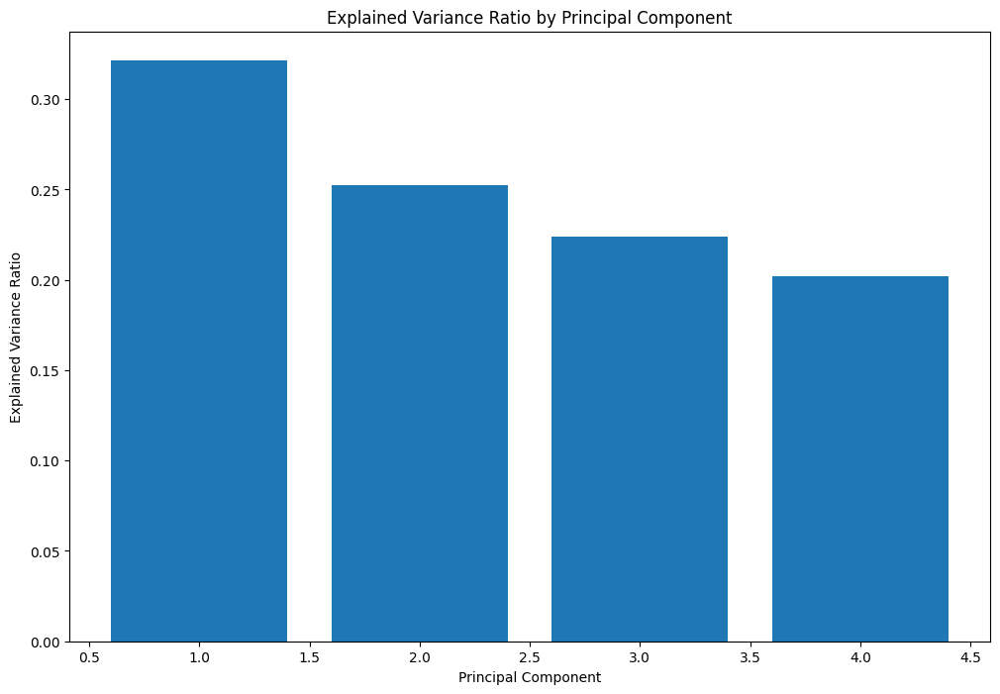

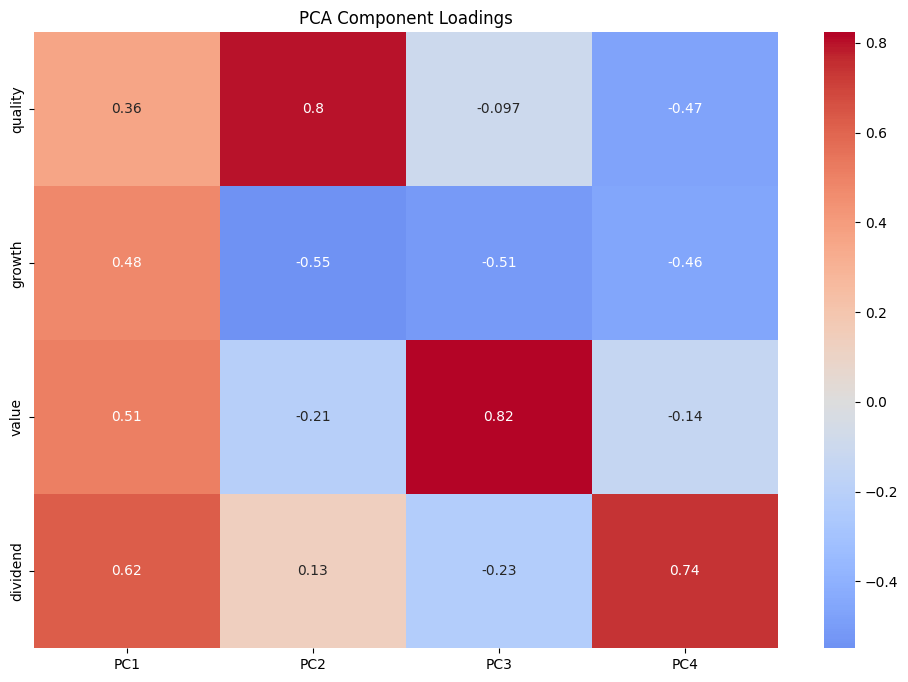

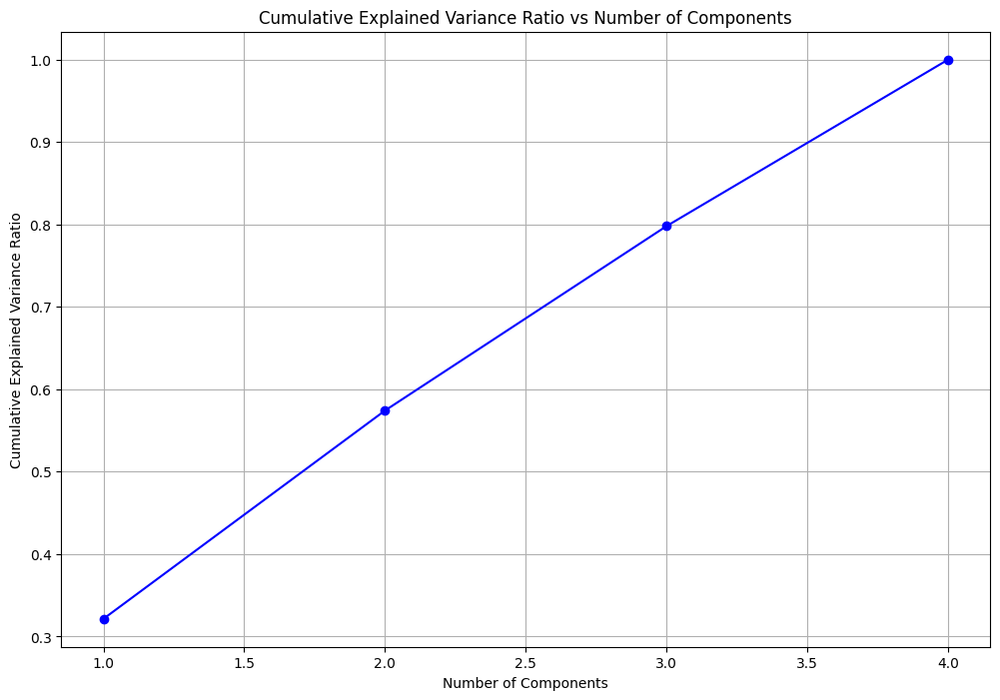

In [5]:
import scipy
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import numpy as np

# Prepare data for PCA
features = [
    "quality",
    "growth",
    "value",
    "dividend",
]
X = df[features]

# Standardize the features


scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply PCA

pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Calculate explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Plot explained variance ratio
plt.figure(figsize=(12, 8))
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio)
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.title("Explained Variance Ratio by Principal Component")
plt.show()

# Create a DataFrame with component loadings
loadings = pd.DataFrame(
    pca.components_.T, columns=["PC1", "PC2", "PC3", "PC4"], index=features
)

# Plot heatmap of component loadings
plt.figure(figsize=(12, 8))
sns.heatmap(loadings, annot=True, cmap="coolwarm", center=0)
plt.title("PCA Component Loadings")
plt.show()

# Calculate cumulative explained variance ratio
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)
plt.figure(figsize=(12, 8))
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, "bo-")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance Ratio")
plt.title("Cumulative Explained Variance Ratio vs Number of Components")
plt.grid(True)
plt.show()

# Checking on outliers

9.525058637153919 13.341766112353717


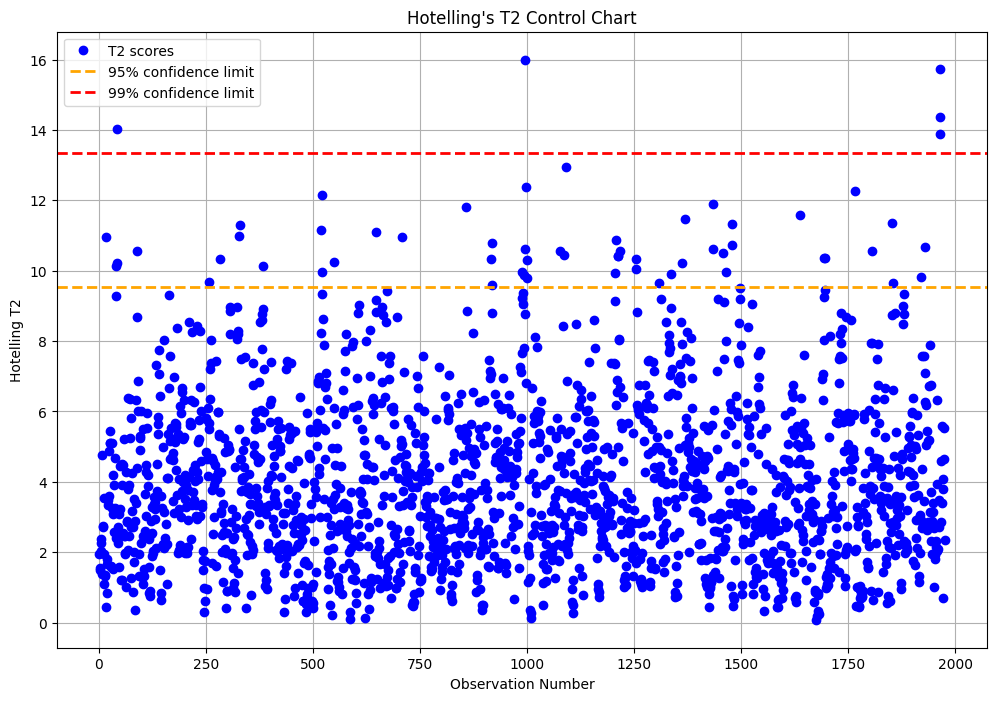

In [6]:
# Calculate Hotelling's T2 statistic
K = 4  # Number of principal components to use
scores = X_pca[:, :K]
t2_scores = np.sum(scores**2 / pca.explained_variance_[:K], axis=1)

# Calculate F-distribution critical values
n = len(X)  # Number of observations
F95 = (
    K * (n**2 - 1) / (n * (n - K)) * scipy.stats.f.ppf(0.95, K, n - K)
)  # ppf is the percent point function (inverse of cdf) of the F distribution
F99 = K * (n**2 - 1) / (n * (n - K)) * scipy.stats.f.ppf(0.99, K, n - K)
print(F95, F99)
# Plot Hotelling's T2
plt.figure(figsize=(12, 8))
plt.plot(range(1, len(t2_scores) + 1), t2_scores, "bo", label="T2 scores")
plt.axhline(
    y=F95, color="orange", linestyle="--", linewidth=2, label="95% confidence limit"
)
plt.axhline(
    y=F99, color="red", linestyle="--", linewidth=2, label="99% confidence limit"
)
plt.xlabel("Observation Number")
plt.ylabel("Hotelling T2")
plt.title("Hotelling's T2 Control Chart")
plt.legend()
plt.grid(True)
plt.show()

In [7]:
# Delete the outliers
df = df[t2_scores < F95]
X = df[features]
X_scaled = scaler.fit_transform(X)
X_pca = pca.fit_transform(X_scaled)

Correlations with profit_1m:
 PC1   -0.003525
PC2    0.067424
PC3   -0.126207
PC4    0.012848
Name: profit_1m, dtype: float64


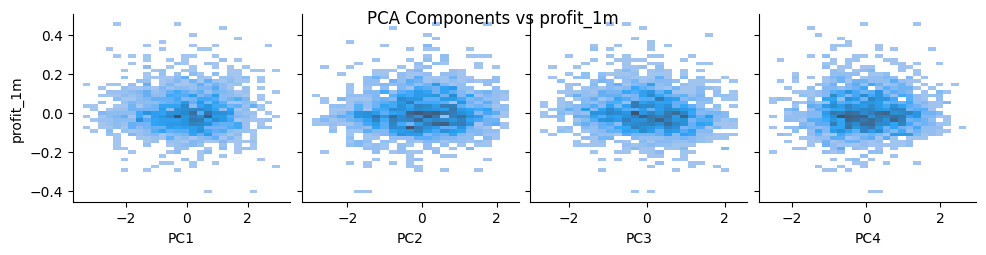

Correlations with profit_3m:
 PC1         -0.123876
PC2          0.130082
PC3         -0.226241
PC4          0.065542
profit_1m    0.487381
Name: profit_3m, dtype: float64


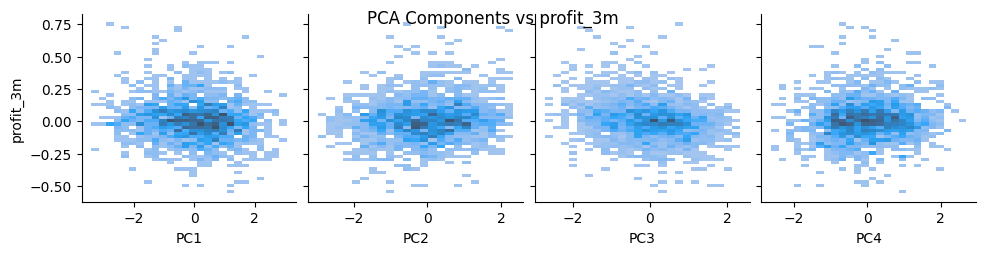

Correlations with profit_6m:
 PC1         -0.118346
PC2          0.113890
PC3         -0.224816
PC4          0.059129
profit_1m    0.252876
profit_3m    0.640749
Name: profit_6m, dtype: float64


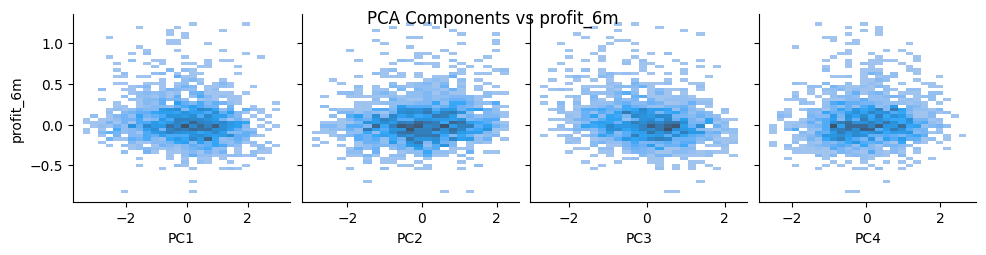

Correlations with profit_1y:
 PC1         -0.136472
PC2          0.131843
PC3         -0.232864
PC4          0.083992
profit_1m    0.179721
profit_3m    0.470215
profit_6m    0.601357
Name: profit_1y, dtype: float64


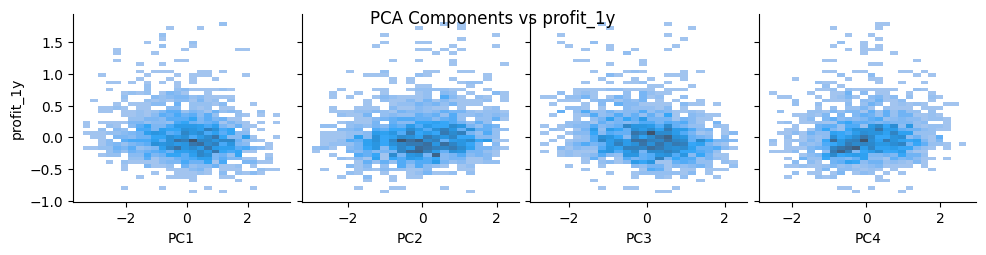

Correlations with profit_2y:
 PC1         -0.027935
PC2          0.118540
PC3         -0.336217
PC4          0.048510
profit_1m    0.121545
profit_3m    0.256897
profit_6m    0.311469
profit_1y    0.565929
Name: profit_2y, dtype: float64


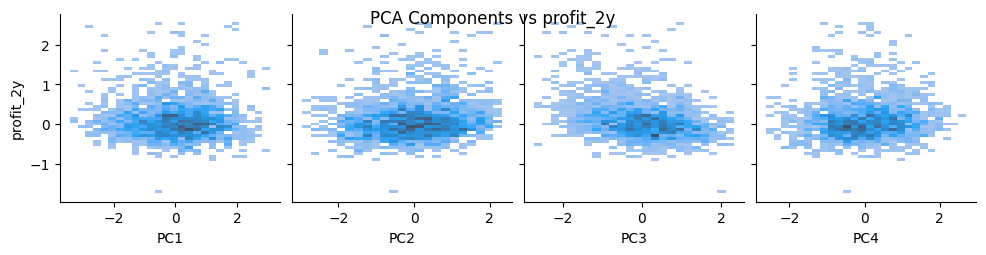

Correlations with profit_5y:
 PC1          0.114008
PC2          0.138107
PC3         -0.469913
PC4         -0.037723
profit_1m    0.060159
profit_3m    0.165728
profit_6m    0.251571
profit_1y    0.297047
profit_2y    0.443905
Name: profit_5y, dtype: float64


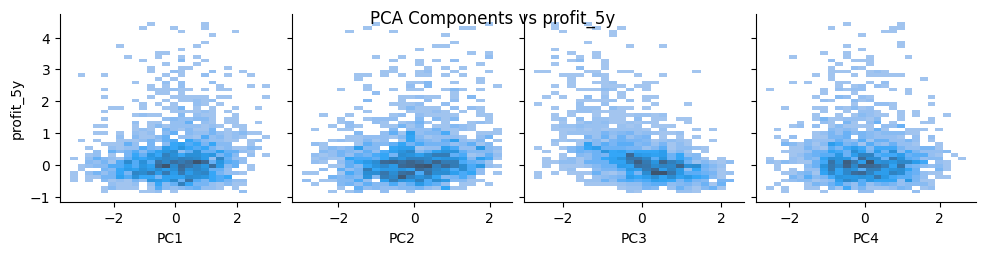

In [8]:
df_pca = pd.DataFrame(X_pca, columns=["PC1", "PC2", "PC3", "PC4"])

for target_profit in [
    "profit_1m",
    "profit_3m",
    "profit_6m",
    "profit_1y",
    "profit_2y",
    "profit_5y",
]:
    df_pca[target_profit] = df[target_profit].values  # repeat per target

    sns.pairplot(
        df_pca,
        x_vars=["PC1", "PC2", "PC3", "PC4"],
        y_vars=target_profit,
        kind="hist",
    )
    plt.suptitle(f"PCA Components vs {target_profit}")
    correlations = df_pca.corr()[target_profit].drop(target_profit)
    print(f"Correlations with {target_profit}:\n", correlations)
    plt.show()

### Contribution to each variable

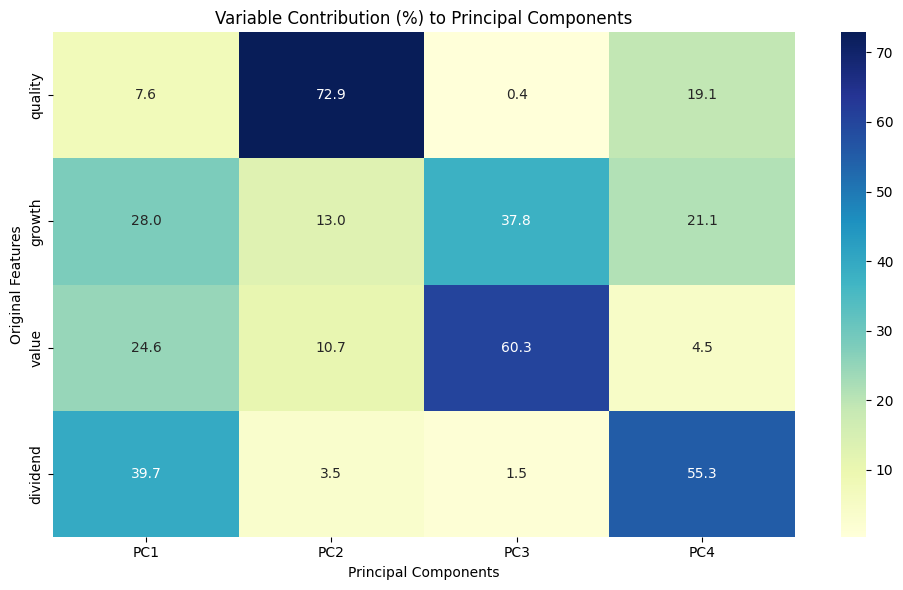

In [9]:
loadings = pd.DataFrame(
    pca.components_.T, columns=["PC1", "PC2", "PC3", "PC4"], index=features
)
# Square the loadings
squared_loadings = loadings**2

# Normalize by each component to get % contribution
contributions = squared_loadings.div(squared_loadings.sum(axis=0), axis=1) * 100

plt.figure(figsize=(10, 6))
sns.heatmap(contributions, annot=True, cmap="YlGnBu", fmt=".1f")
plt.title("Variable Contribution (%) to Principal Components")
plt.ylabel("Original Features")
plt.xlabel("Principal Components")
plt.tight_layout()
plt.show()

# Linear regression

In [10]:
from sklearn.linear_model import LinearRegression

for target_profit in [
    "profit_1m",
    "profit_3m",
    "profit_6m",
    "profit_1y",
    "profit_2y",
    "profit_5y",
]:
    X = df_pca[["PC1", "PC2", "PC3", "PC4"]]  # or include more PCs
    y = df_pca[target_profit]

    model = LinearRegression()
    model.fit(X, y)
    r2 = model.score(X, y)
    print(f"R^2 for predicting {target_profit} from PCs: {r2:.3f}")

R^2 for predicting profit_1m from PCs: 0.021
R^2 for predicting profit_3m from PCs: 0.088
R^2 for predicting profit_6m from PCs: 0.081
R^2 for predicting profit_1y from PCs: 0.097
R^2 for predicting profit_2y from PCs: 0.130
R^2 for predicting profit_5y from PCs: 0.254


# ARIMAX


ARIMAX Analysis for profit_1m
----------------------------------------
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-2064.456, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-2606.219, Time=0.04 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-2066.456, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=-2951.383, Time=0.06 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=-3117.676, Time=0.07 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.03 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.98 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=-3119.675, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=-2953.383, Time=0.03 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(3,1,1)(0,0,0)[0]             : AIC=inf, Time=0.53 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,1)(0,0,0)[0]             : AIC=inf, Time=0.35 sec

Best model:  ARIMA(3,1,0)(0,0,0)[0]          
Total fit time: 3.664 seconds

Best ARIMA order: (3, 1, 0)
AIC: -3127.89
BIC: -3083.45


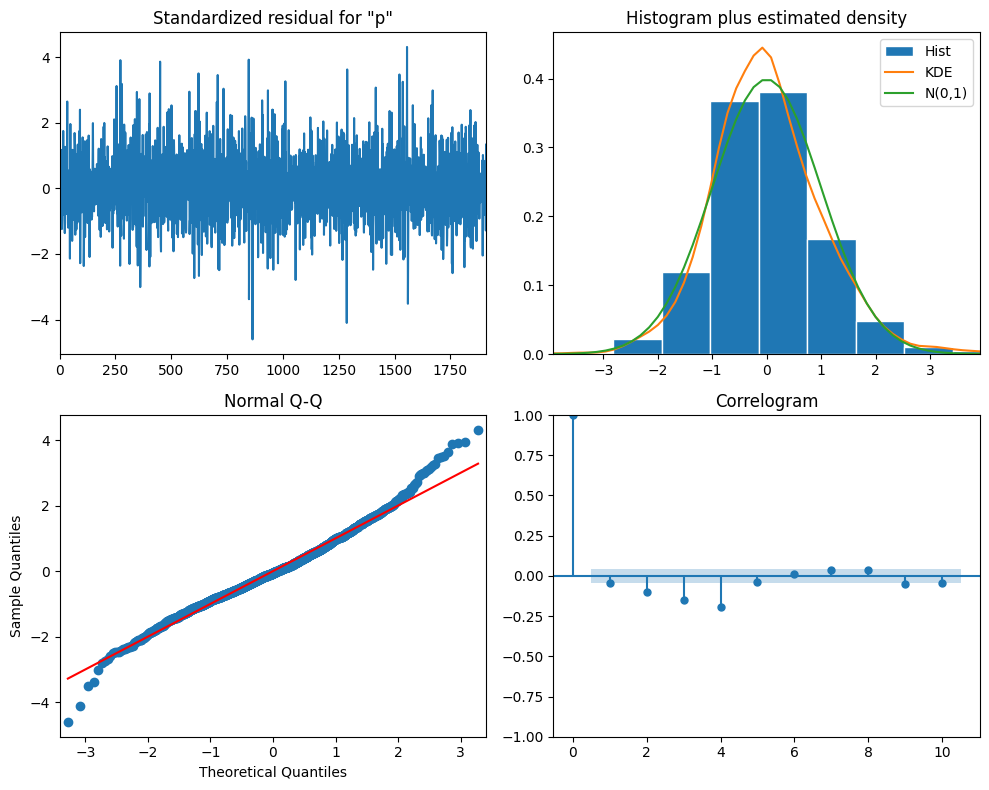


Exogenous Variables Summary:
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
PC1           -0.0009      0.002     -0.434      0.664      -0.005       0.003
PC2            0.0070      0.003      2.566      0.010       0.002       0.012
PC3           -0.0097      0.003     -3.855      0.000      -0.015      -0.005
PC4            0.0008      0.003      0.277      0.782      -0.005       0.006
ar.L1         -0.8155      0.021    -39.709      0.000      -0.856      -0.775
ar.L2         -0.6048      0.024    -24.765      0.000      -0.653      -0.557
ar.L3         -0.2864      0.021    -13.735      0.000      -0.327      -0.246
sigma2         0.0113      0.000     38.448      0.000       0.011       0.012

ARIMAX Analysis for profit_3m
----------------------------------------
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-511.697, Time=0.06 sec

/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.41 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-513.697, Time=0.04 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=-1316.039, Time=0.05 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=-1410.078, Time=0.11 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.67 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=-1412.077, Time=0.07 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=-1318.039, Time=0.03 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(3,1,1)(0,0,0)[0]             : AIC=inf, Time=0.46 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,1)(0,0,0)[0]             : AIC=inf, Time=0.28 sec

Best model:  ARIMA(3,1,0)(0,0,0)[0]          
Total fit time: 2.843 seconds

Best ARIMA order: (3, 1, 0)
AIC: -1586.95
BIC: -1542.50


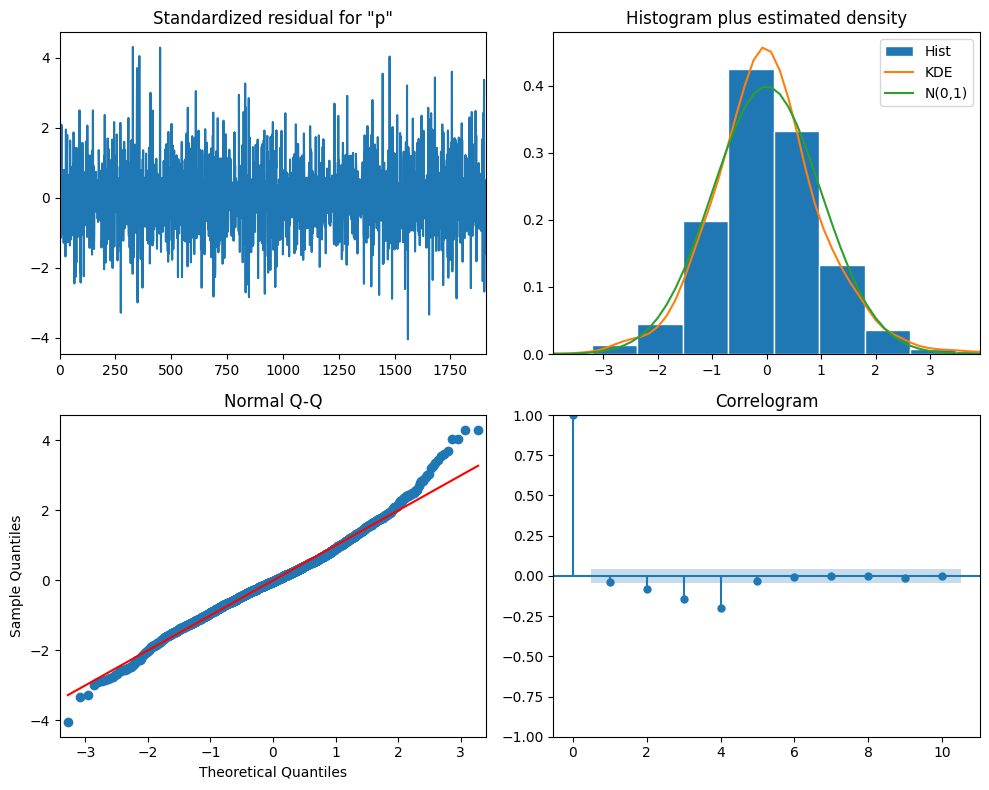


Exogenous Variables Summary:
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
PC1           -0.0210      0.003     -6.951      0.000      -0.027      -0.015
PC2            0.0204      0.004      4.743      0.000       0.012       0.029
PC3           -0.0391      0.004    -10.171      0.000      -0.047      -0.032
PC4            0.0147      0.004      3.541      0.000       0.007       0.023
ar.L1         -0.7363      0.021    -35.600      0.000      -0.777      -0.696
ar.L2         -0.4415      0.024    -18.251      0.000      -0.489      -0.394
ar.L3         -0.1995      0.020     -9.874      0.000      -0.239      -0.160
sigma2         0.0253      0.001     38.088      0.000       0.024       0.027

ARIMAX Analysis for profit_6m
----------------------------------------
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1098.665, Time=0.06 sec

/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.26 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1096.666, Time=0.03 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=541.814, Time=0.09 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=466.453, Time=0.09 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.77 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=464.453, Time=0.06 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=539.814, Time=0.04 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(3,1,1)(0,0,0)[0]             : AIC=inf, Time=0.41 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,1)(0,0,0)[0]             : AIC=inf, Time=0.35 sec

Best model:  ARIMA(3,1,0)(0,0,0)[0]          
Total fit time: 2.813 seconds

Best ARIMA order: (3, 1, 0)
AIC: 302.94
BIC: 347.39


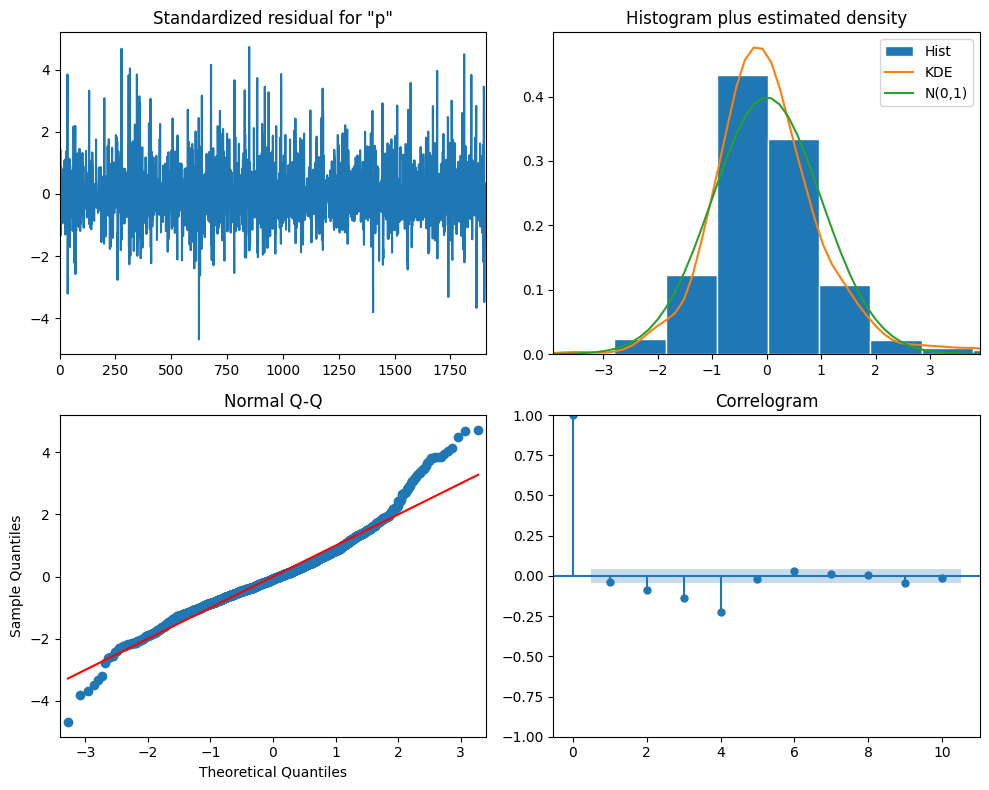


Exogenous Variables Summary:
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
PC1           -0.0346      0.005     -7.074      0.000      -0.044      -0.025
PC2            0.0215      0.007      2.873      0.004       0.007       0.036
PC3           -0.0642      0.006    -10.819      0.000      -0.076      -0.053
PC4            0.0326      0.007      4.465      0.000       0.018       0.047
ar.L1         -0.5992      0.018    -33.884      0.000      -0.634      -0.565
ar.L2         -0.3691      0.021    -17.948      0.000      -0.409      -0.329
ar.L3         -0.1889      0.021     -8.950      0.000      -0.230      -0.148
sigma2         0.0680      0.002     44.843      0.000       0.065       0.071

ARIMAX Analysis for profit_1y
----------------------------------------
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=1862.470, Time=0.07 sec

/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=1251.746, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=1860.470, Time=0.04 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.46 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.33 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=1.12 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=1250.166, Time=0.07 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,1)(0,0,0)[0]             : AIC=inf, Time=0.35 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,2)(0,0,0)[0]             : AIC=inf, Time=0.23 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=1647.379, Time=0.03 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,2)(0,0,0)[0]             : AIC=inf, Time=0.38 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 3.301 seconds

Best ARIMA order: (0, 1, 1)
AIC: 1067.26
BIC: 1100.59


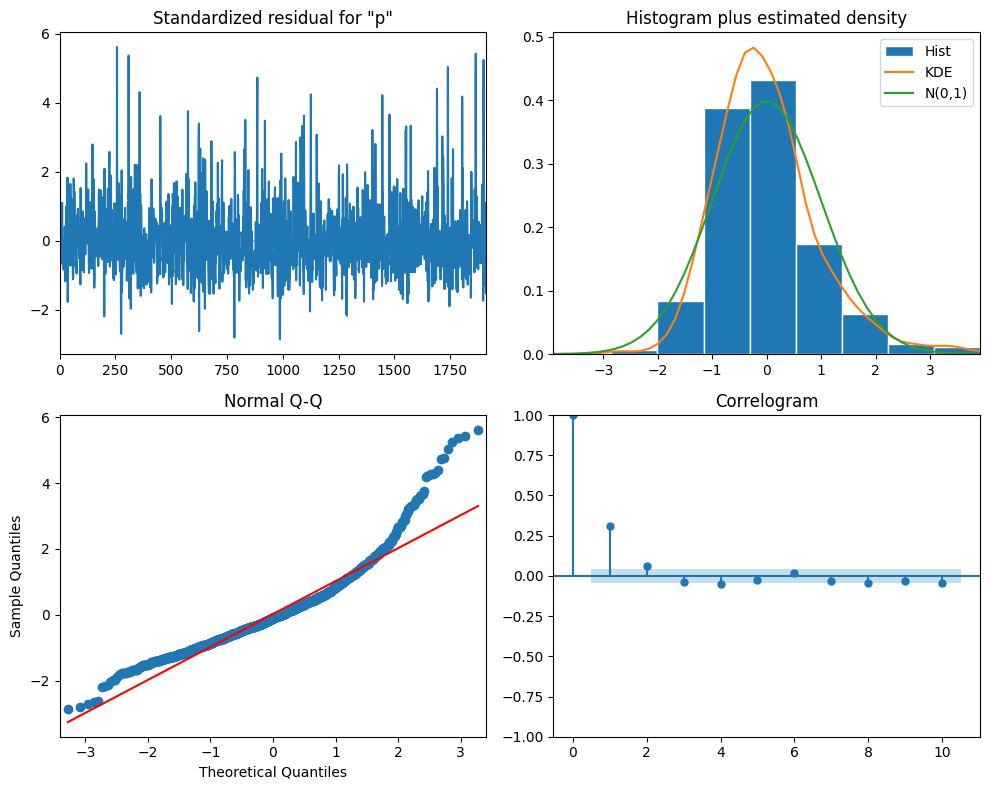


Exogenous Variables Summary:
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
PC1           -0.0388      0.006     -6.190      0.000      -0.051      -0.027
PC2            0.0429      0.007      5.828      0.000       0.028       0.057
PC3           -0.0826      0.007    -11.174      0.000      -0.097      -0.068
PC4            0.0328      0.008      3.937      0.000       0.016       0.049
ma.L1         -0.9903      0.003   -284.871      0.000      -0.997      -0.984
sigma2         0.1015      0.002     51.529      0.000       0.098       0.105

ARIMAX Analysis for profit_2y
----------------------------------------
Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=2900.162, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=2779.132, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=2572.056, Time=0.10 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm

 ARIMA(0,1,0)(0,0,0)[0]             : AIC=2898.162, Time=0.03 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.77 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=2262.486, Time=0.40 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.58 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.72 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=2256.493, Time=0.85 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.95 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.40 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,3)(0,0,0)[0]             : AIC=inf, Time=0.53 sec

Best model:  ARIMA(1,1,3)(0,0,0)[0] intercept
Total fit time: 5.429 seconds

Best ARIMA order: (1, 1, 3)
AIC: 1993.48
BIC: 2043.48


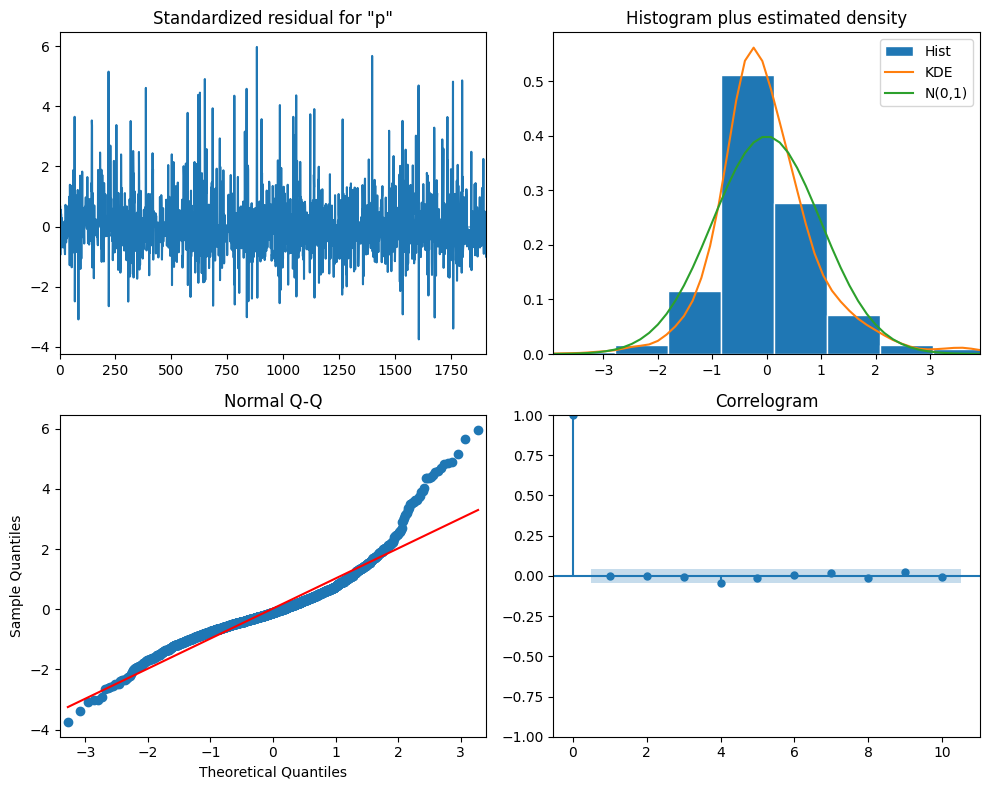


Exogenous Variables Summary:
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
PC1           -0.0145      0.009     -1.671      0.095      -0.032       0.003
PC2            0.0519      0.012      4.500      0.000       0.029       0.075
PC3           -0.1734      0.010    -16.580      0.000      -0.194      -0.153
PC4            0.0173      0.012      1.424      0.155      -0.007       0.041
ar.L1          0.1329      0.197      0.674      0.501      -0.254       0.520
ma.L1         -0.6992      0.198     -3.532      0.000      -1.087      -0.311
ma.L2         -0.2292      0.118     -1.941      0.052      -0.461       0.002
ma.L3         -0.0646      0.082     -0.788      0.431      -0.225       0.096
sigma2         0.1643      0.003     53.629      0.000       0.158       0.170

ARIMAX Analysis for profit_5y
----------------------------------------
Performing stepwise search to

/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm

 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=3917.575, Time=0.12 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.51 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.69 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=3915.576, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=3977.979, Time=0.03 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,2)(0,0,0)[0]             : AIC=inf, Time=0.21 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(0,1,3)(0,0,0)[0]             : AIC=inf, Time=0.31 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=inf, Time=0.14 sec


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


 ARIMA(1,1,3)(0,0,0)[0]             : AIC=inf, Time=0.40 sec

Best model:  ARIMA(0,1,2)(0,0,0)[0]          
Total fit time: 3.817 seconds

Best ARIMA order: (0, 1, 2)
AIC: 3514.01
BIC: 3552.91


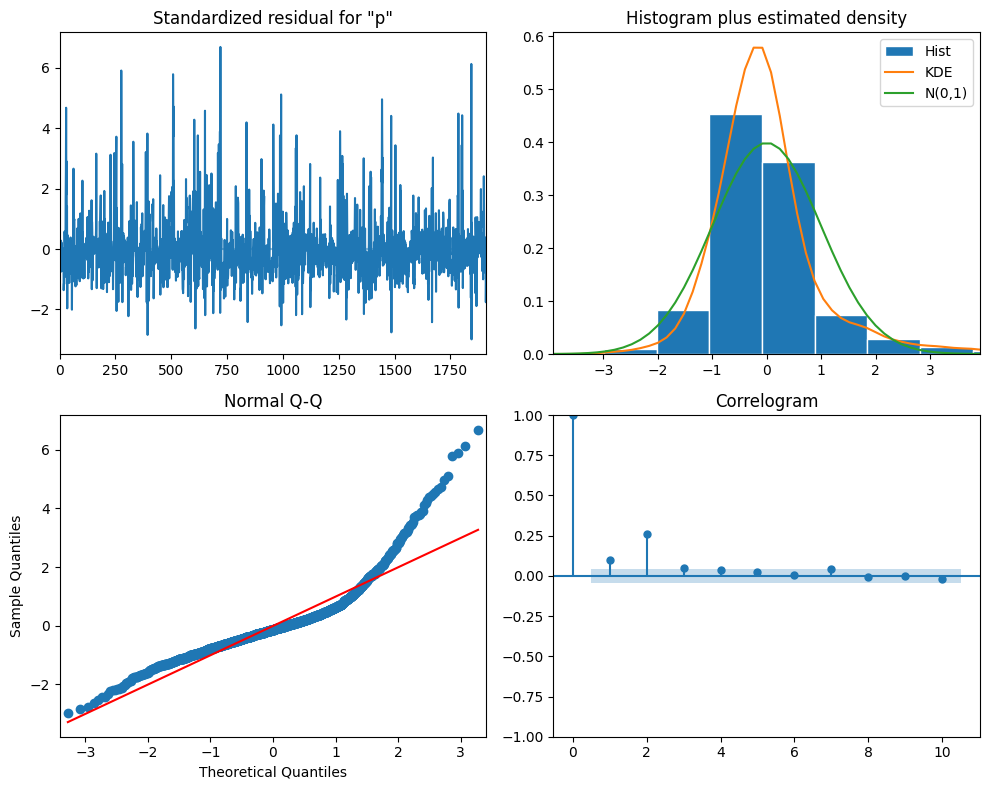


Exogenous Variables Summary:
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
PC1            0.0719      0.012      5.773      0.000       0.047       0.096
PC2            0.1062      0.016      6.697      0.000       0.075       0.137
PC3           -0.3580      0.015    -24.014      0.000      -0.387      -0.329
PC4           -0.0436      0.017     -2.493      0.013      -0.078      -0.009
ma.L1         -0.5922      0.014    -42.606      0.000      -0.619      -0.565
ma.L2         -0.4178      0.014    -30.550      0.000      -0.445      -0.391
sigma2         0.3594      0.007     51.882      0.000       0.346       0.373


In [11]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
import numpy as np
from pmdarima import auto_arima

# We'll create ARIMAX models for each profit target using PCs as exogenous variables
profit_targets = [
    "profit_1m",
    "profit_3m",
    "profit_6m",
    "profit_1y",
    "profit_2y",
    "profit_5y",
]
exog_vars = df_pca[["PC1", "PC2", "PC3", "PC4"]]

for target in profit_targets:
    print(f"\nARIMAX Analysis for {target}")
    print("-" * 40)

    # Prepare the target variable
    y = df_pca[target]

    try:
        # Use auto_arima to find the best parameters
        auto_model = auto_arima(
            y,
            exogenous=exog_vars,
            start_p=0,
            start_q=0,
            max_p=3,
            max_q=3,
            m=1,
            start_P=0,
            seasonal=False,
            d=1,
            D=0,
            trace=True,
            error_action="ignore",
            suppress_warnings=True,
            stepwise=True,
        )

        best_order = auto_model.order

        # Fit ARIMAX model with best parameters
        model = SARIMAX(
            y,
            exog=exog_vars,
            order=best_order,
            enforce_stationarity=False,
            enforce_invertibility=False,
        )

        results = model.fit()

        # Print model summary
        print(f"\nBest ARIMA order: {best_order}")
        print(f"AIC: {results.aic:.2f}")
        print(f"BIC: {results.bic:.2f}")

        # Plot diagnostics
        fig = results.plot_diagnostics(figsize=(10, 8))
        plt.tight_layout()
        plt.show()

        # Print summary of exogenous variables impact
        print("\nExogenous Variables Summary:")
        print(results.summary().tables[1])

    except Exception as e:
        print(f"Error fitting model for {target}: {str(e)}")

### Including dummy variables


ARIMAX Analysis for profit_1m with Dummy Variables
--------------------------------------------------


/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC: -3457.18
BIC: -3057.11


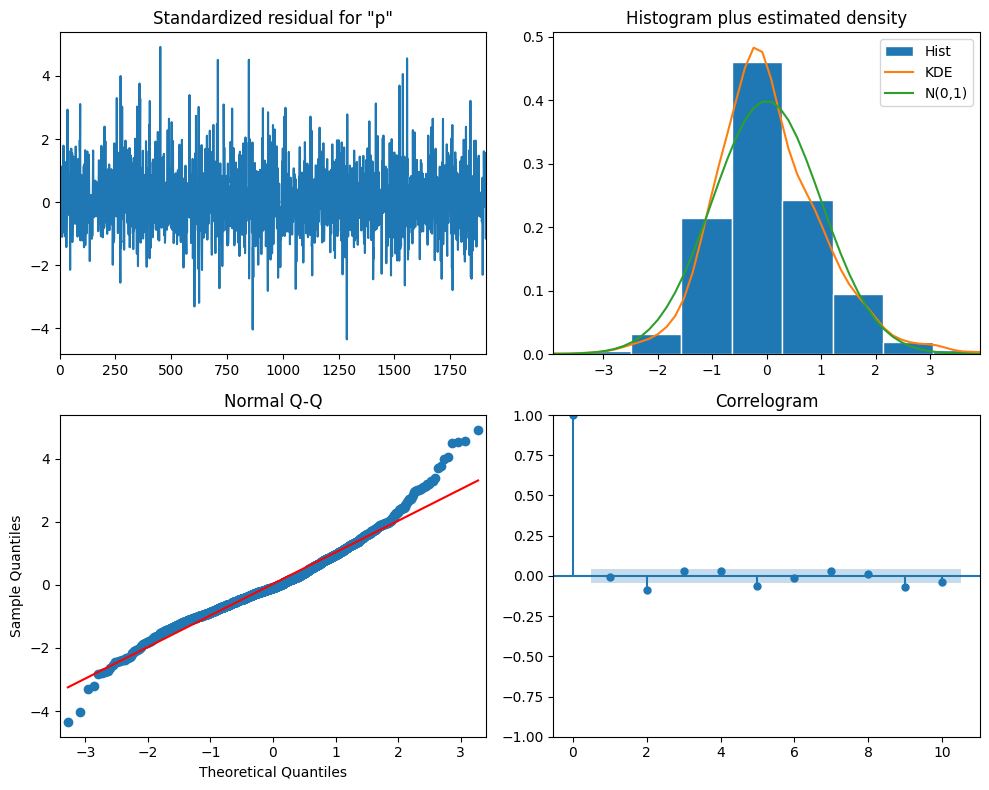


Exogenous Variables Summary:
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
PC1                              -0.0003      0.002     -0.170      0.865      -0.004       0.003
PC2                               0.0065      0.002      2.850      0.004       0.002       0.011
PC3                              -0.0139      0.002     -5.748      0.000      -0.019      -0.009
PC4                               0.0016      0.003      0.638      0.524      -0.003       0.007
country_BD                       -0.0241      0.021     -1.148      0.251      -0.065       0.017
country_BE                        0.0933      0.053      1.754      0.079      -0.011       0.198
country_BM                       -0.0251      0.028     -0.889      0.374      -0.081       0.030
country_BR                        0.0185      0.028      0.669      0.503      -0.036   

/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC: -1932.96
BIC: -1532.90


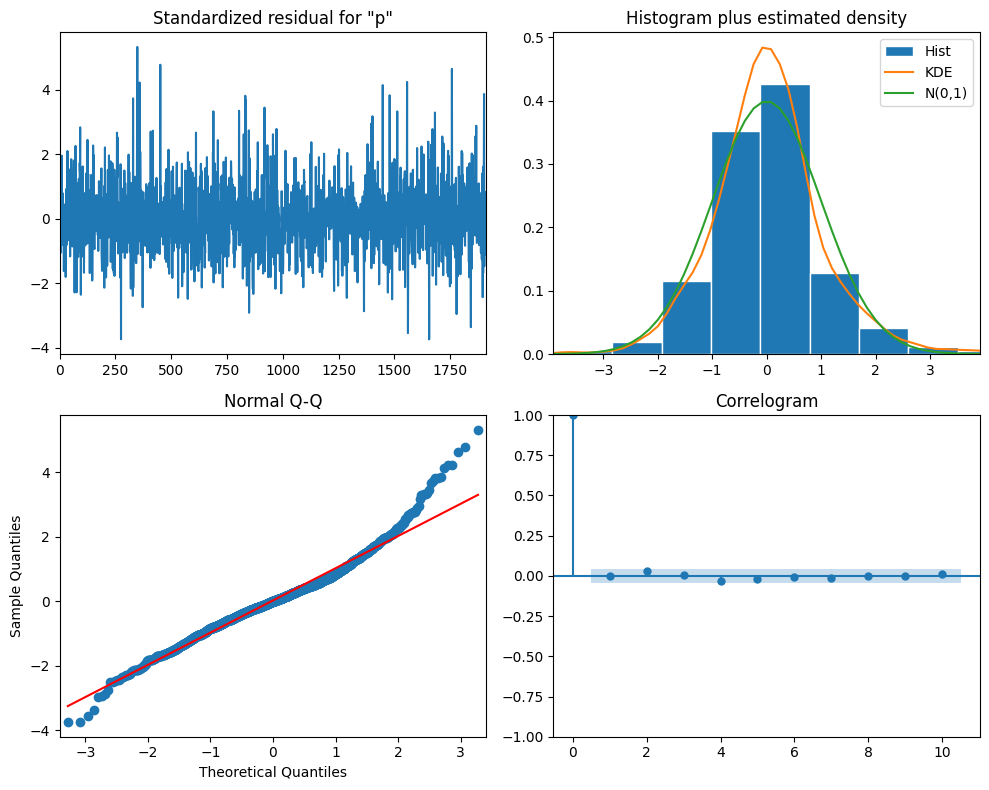


Exogenous Variables Summary:
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
PC1                              -0.0165      0.003     -5.566      0.000      -0.022      -0.011
PC2                               0.0196      0.004      5.379      0.000       0.012       0.027
PC3                              -0.0374      0.004     -9.778      0.000      -0.045      -0.030
PC4                               0.0121      0.004      3.049      0.002       0.004       0.020
country_BD                       -0.0059      0.033     -0.182      0.856      -0.070       0.058
country_BE                        0.0947      0.157      0.602      0.547      -0.214       0.403
country_BM                       -0.0378      0.046     -0.815      0.415      -0.129       0.053
country_BR                       -0.0336      0.071     -0.475      0.635      -0.173   

/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC: -100.61
BIC: 299.45


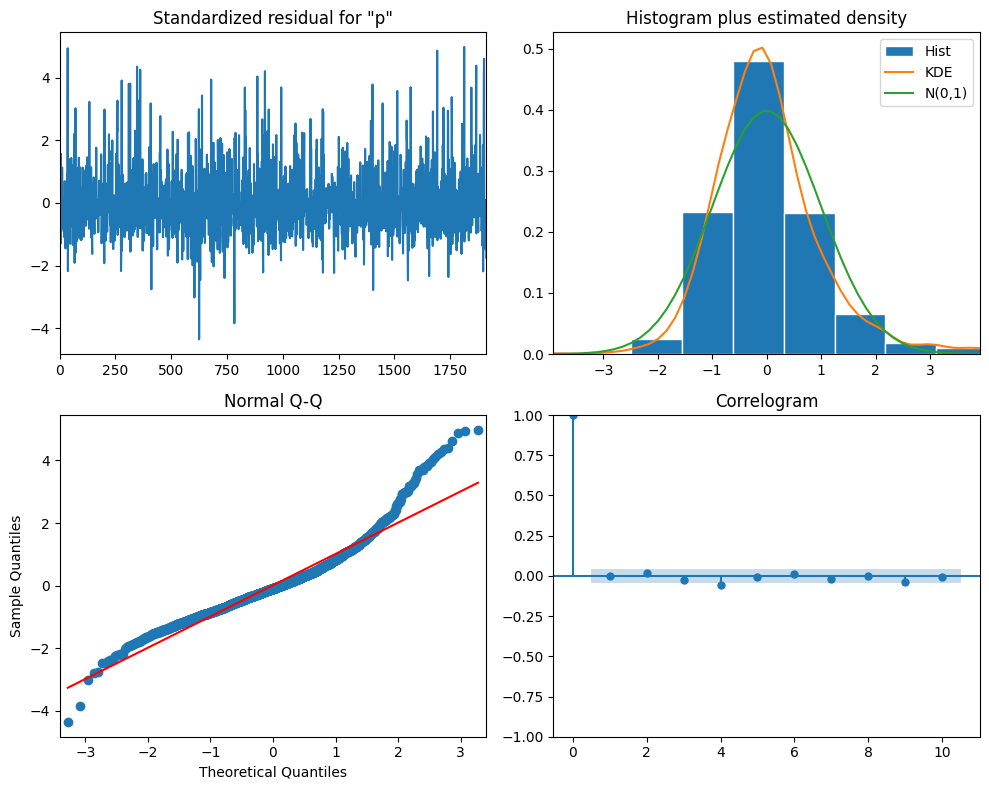


Exogenous Variables Summary:
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
PC1                              -0.0289      0.005     -5.670      0.000      -0.039      -0.019
PC2                               0.0251      0.006      3.961      0.000       0.013       0.038
PC3                              -0.0628      0.006    -10.039      0.000      -0.075      -0.051
PC4                               0.0220      0.007      3.151      0.002       0.008       0.036
country_BD                       -0.0066      0.069     -0.095      0.924      -0.142       0.129
country_BE                        0.0365      0.166      0.219      0.826      -0.289       0.362
country_BM                       -0.0169      0.095     -0.178      0.859      -0.203       0.169
country_BR                        0.0288      0.105      0.273      0.785      -0.178   

/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC: 896.27
BIC: 1296.33


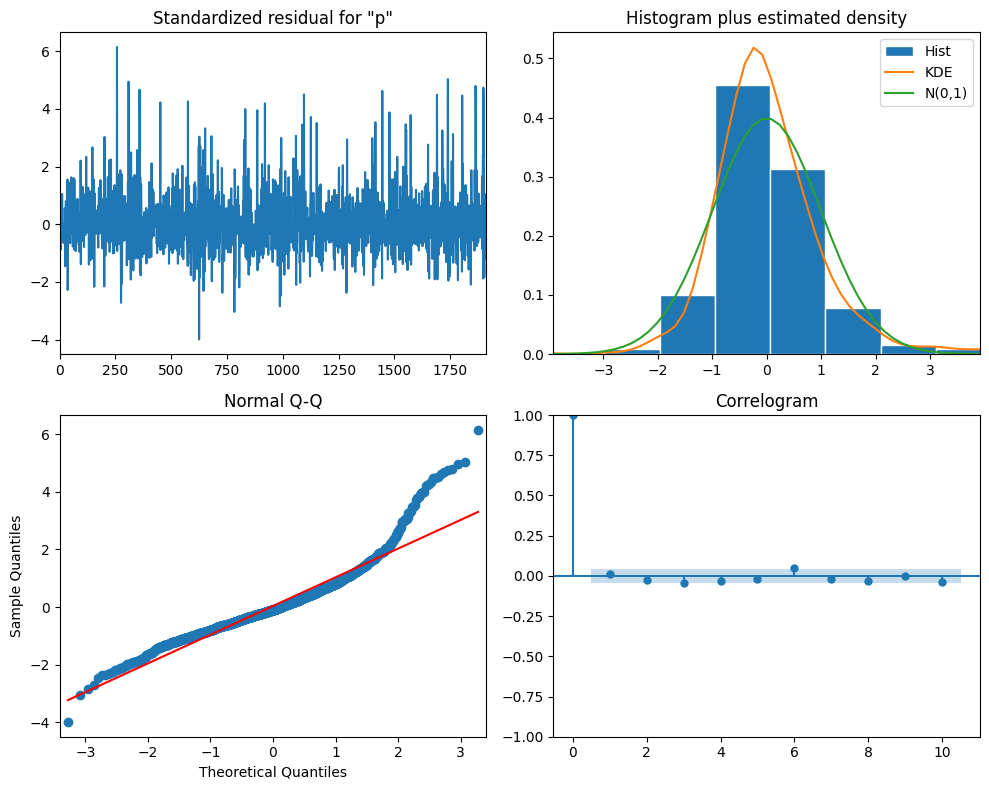


Exogenous Variables Summary:
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
PC1                              -0.0429      0.007     -6.319      0.000      -0.056      -0.030
PC2                               0.0447      0.009      4.921      0.000       0.027       0.062
PC3                              -0.0856      0.009     -9.912      0.000      -0.103      -0.069
PC4                               0.0420      0.010      4.398      0.000       0.023       0.061
country_BD                       -0.1340      0.128     -1.048      0.295      -0.385       0.117
country_BE                       -0.2295      0.651     -0.353      0.724      -1.505       1.046
country_BM                       -0.1039      0.176     -0.591      0.554      -0.448       0.241
country_BR                       -0.0260      0.128     -0.202      0.840      -0.278   

/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC: 2055.62
BIC: 2455.68


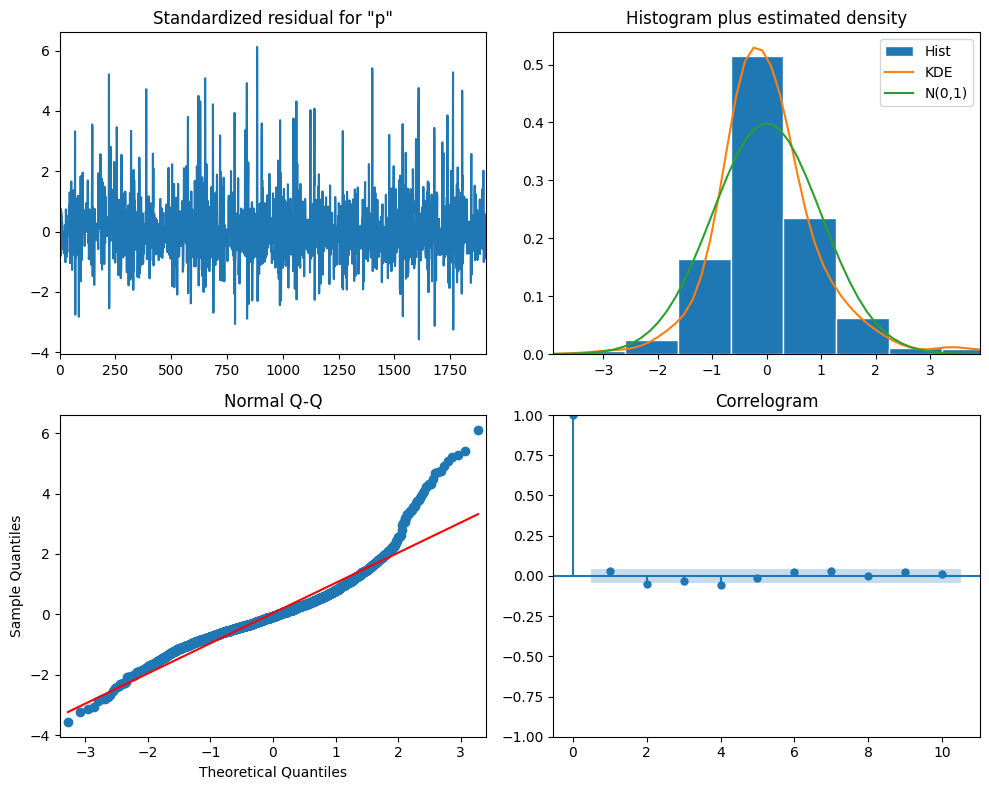


Exogenous Variables Summary:
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
PC1                              -0.0154      0.009     -1.676      0.094      -0.033       0.003
PC2                               0.0472      0.012      3.876      0.000       0.023       0.071
PC3                              -0.1686      0.011    -15.034      0.000      -0.191      -0.147
PC4                               0.0182      0.013      1.438      0.150      -0.007       0.043
country_BD                       -0.2056      0.133     -1.542      0.123      -0.467       0.056
country_BE                       -0.4789      0.763     -0.628      0.530      -1.975       1.017
country_BM                       -0.0441      0.260     -0.169      0.865      -0.554       0.466
country_BR                       -0.0905      0.148     -0.611      0.541      -0.381   

/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


AIC: 3397.32
BIC: 3797.38


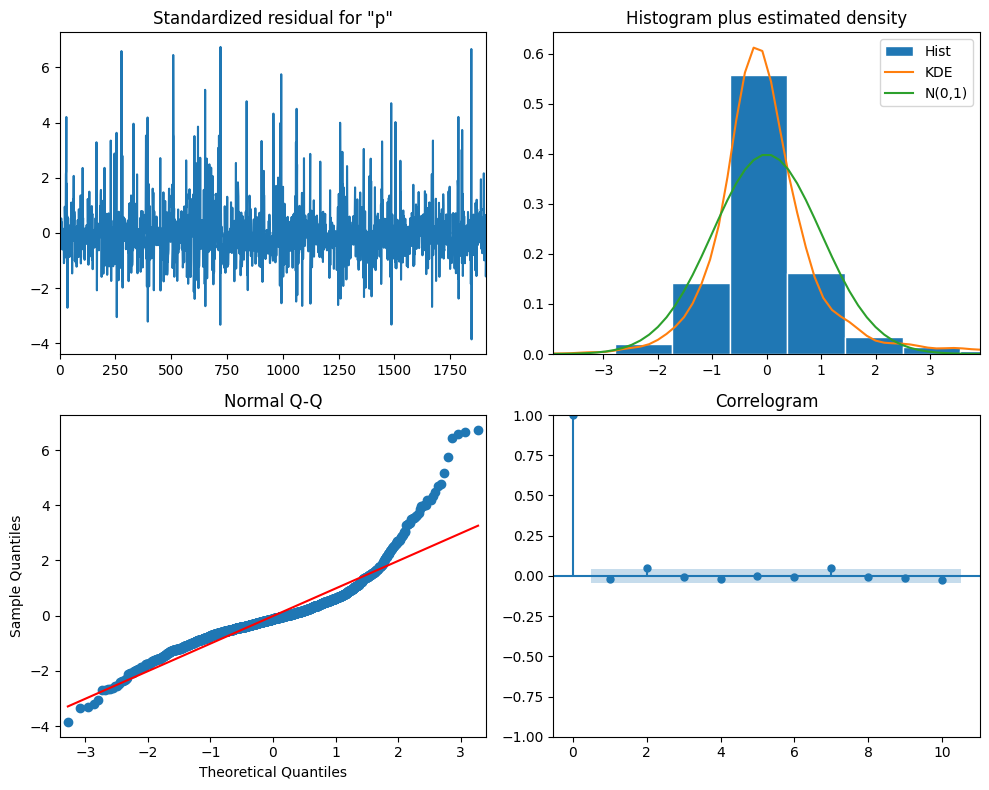


Exogenous Variables Summary:
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
PC1                               0.0627      0.012      5.243      0.000       0.039       0.086
PC2                               0.0978      0.016      6.272      0.000       0.067       0.128
PC3                              -0.3120      0.016    -19.974      0.000      -0.343      -0.281
PC4                              -0.0500      0.017     -2.856      0.004      -0.084      -0.016
country_BD                        0.0574      0.169      0.340      0.734      -0.274       0.389
country_BE                       -0.7416      0.873     -0.850      0.395      -2.452       0.969
country_BM                       -0.1119      0.487     -0.230      0.818      -1.067       0.843
country_BR                        0.1837      0.229      0.801      0.423      -0.266   

In [12]:
# Convert categorical variables to string type
df_pca["country"] = df["country"].astype(str)
df_pca["sector"] = df["sector"].astype(str)

# Create dummy variables for categorical columns
dummy_country = pd.get_dummies(df_pca["country"], prefix="country")
dummy_sector = pd.get_dummies(df_pca["sector"], prefix="sector")

# Combine PCA components with dummy variables
exog_vars_with_dummies = pd.concat([exog_vars, dummy_country, dummy_sector], axis=1)

# Drop one category from each dummy variable group to avoid multicollinearity
exog_vars_with_dummies = exog_vars_with_dummies.drop(
    columns=[dummy_country.columns[0], dummy_sector.columns[0]]
)

# Convert all columns to numeric type
exog_vars_with_dummies = exog_vars_with_dummies.astype(float)

for target in profit_targets:
    print(f"\nARIMAX Analysis for {target} with Dummy Variables")
    print("-" * 50)

    # Prepare the target variable and ensure numeric type
    y = df_pca[target].astype(float)

    try:
        # Fit ARIMAX model with dummy variables
        model = SARIMAX(
            y,
            exog=exog_vars_with_dummies,
            order=(1, 1, 1),
            enforce_stationarity=False,
            enforce_invertibility=False,
        )

        results = model.fit()

        # Print model summary
        print(f"AIC: {results.aic:.2f}")
        print(f"BIC: {results.bic:.2f}")

        # Plot diagnostics
        fig = results.plot_diagnostics(figsize=(10, 8))
        plt.tight_layout()
        plt.show()

        # Print summary of exogenous variables impact
        print("\nExogenous Variables Summary:")
        print(results.summary().tables[1])

    except Exception as e:
        print(f"Error fitting model for {target}: {str(e)}")

# Prophet

/Users/carlosedm10/projects/fundamental-scores-analysis/.venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Importing plotly failed. Interactive plots will not work.


shapes: (1916, 18) (1916, 12)
        PC1       PC2       PC3       PC4  profit_1m  profit_3m  profit_6m  \
0 -0.616763  1.048850  0.638663  0.342794  -0.051239   0.006651   0.016658   
1 -0.931562  0.806187  0.457810 -0.063425   0.003208   0.010006  -0.043546   
2 -0.869095  0.727330  0.587554 -0.103254  -0.020890  -0.002595   0.011493   
3 -0.504467  1.078575  0.564440 -0.765173  -0.018635  -0.021929  -0.036217   
4 -0.557278  1.055991  0.514356 -0.741239   0.006187  -0.014871  -0.065858   

   profit_1y  profit_2y  profit_5y country       sector        date  
0   0.114412  -0.014940   0.040468      NZ  Real Estate  2024-11-01  
1  -0.070544  -0.116168   0.078055      NZ  Real Estate  2024-08-01  
2  -0.037498  -0.199315   0.296551      NZ  Real Estate  2024-03-01  
3  -0.085494  -0.253532   0.436577      NZ  Real Estate  2023-06-01  
4  -0.169314  -0.242305   0.483670      NZ  Real Estate  2023-03-01  
Prophet Analysis
--------------------------------------------------

Prophet Anal

16:45:02 - cmdstanpy - INFO - Chain [1] start processing
16:45:02 - cmdstanpy - INFO - Chain [1] done processing


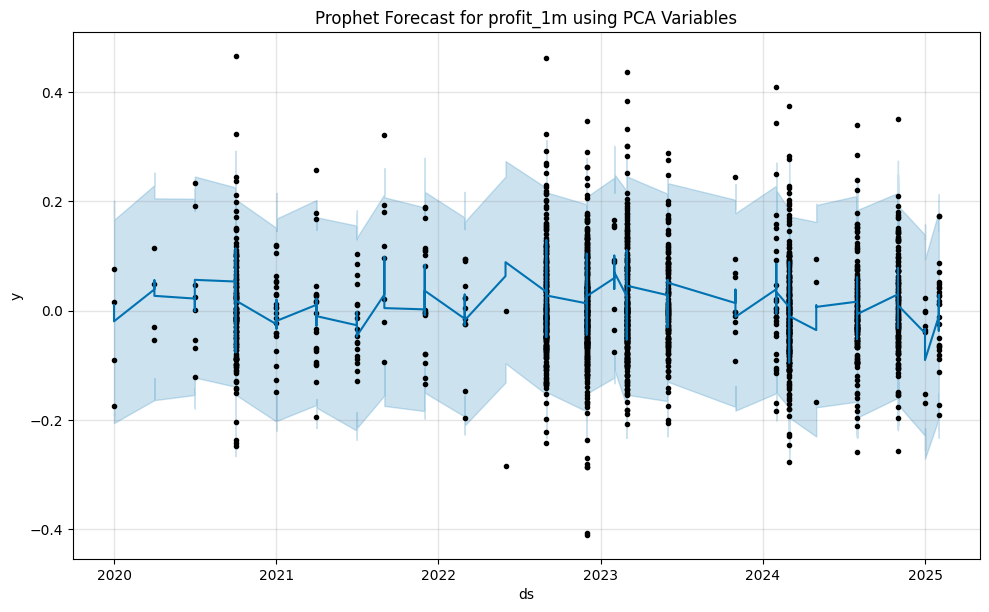

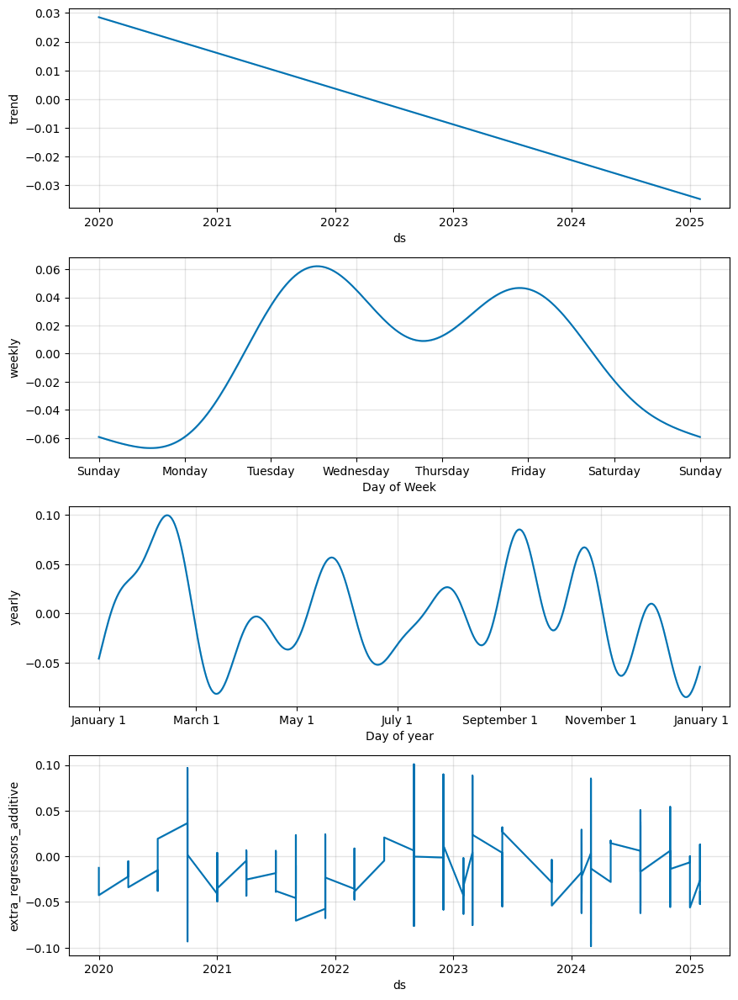

16:45:03 - cmdstanpy - INFO - Chain [1] start processing
16:45:03 - cmdstanpy - INFO - Chain [1] done processing


Model Metrics:
RMSE: 0.0995
MAE: 0.0748

Model with Original Scores:


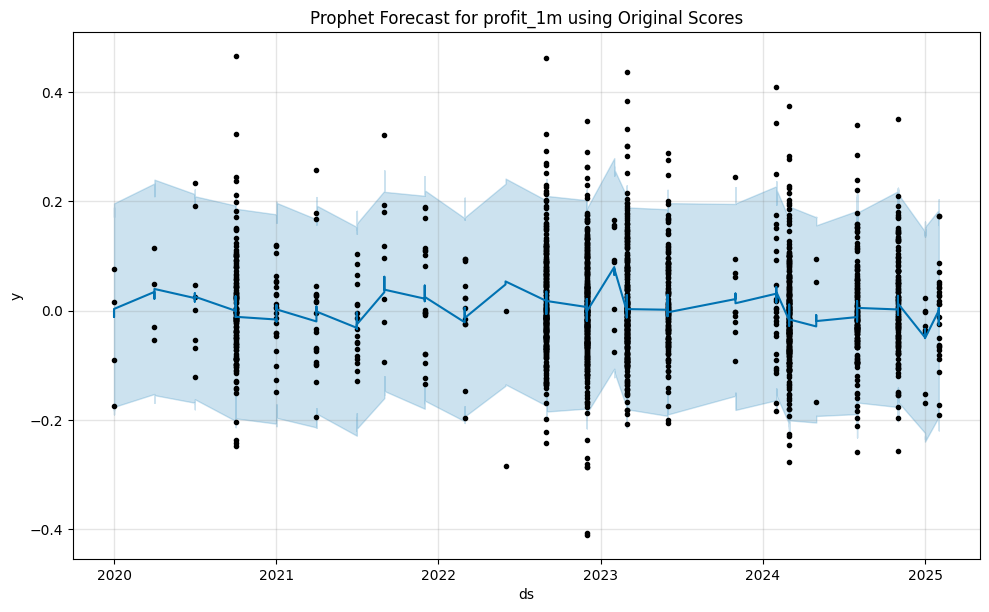

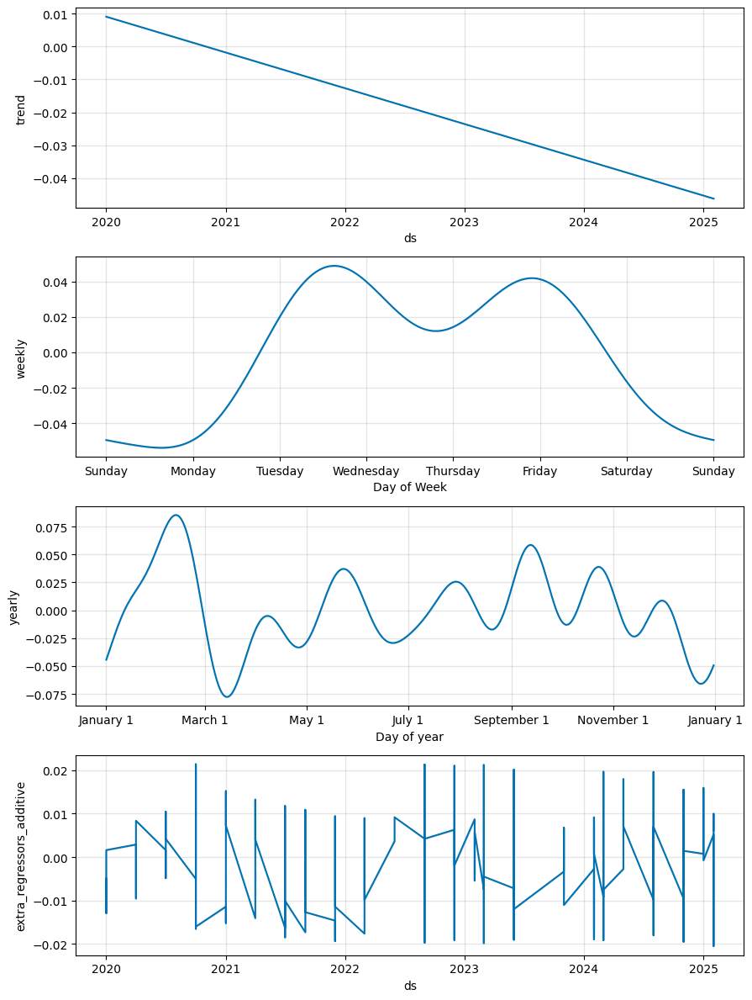

16:45:04 - cmdstanpy - INFO - Chain [1] start processing


Model Metrics:
RMSE: 0.0985
MAE: 0.0743

Comparison for profit_1m:
------------------------------
PCA Variables:
RMSE: 0.0995
MAE: 0.0748

Original Scores:
RMSE: 0.0985
MAE: 0.0743


Prophet Analysis for profit_3m
------------------------------

Model with PCA Variables:


16:45:04 - cmdstanpy - INFO - Chain [1] done processing


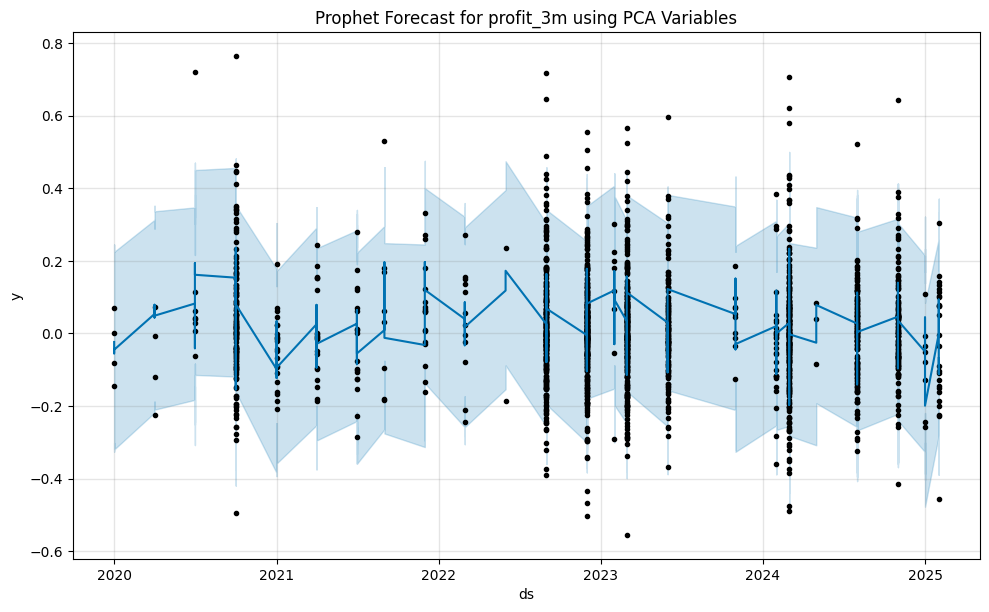

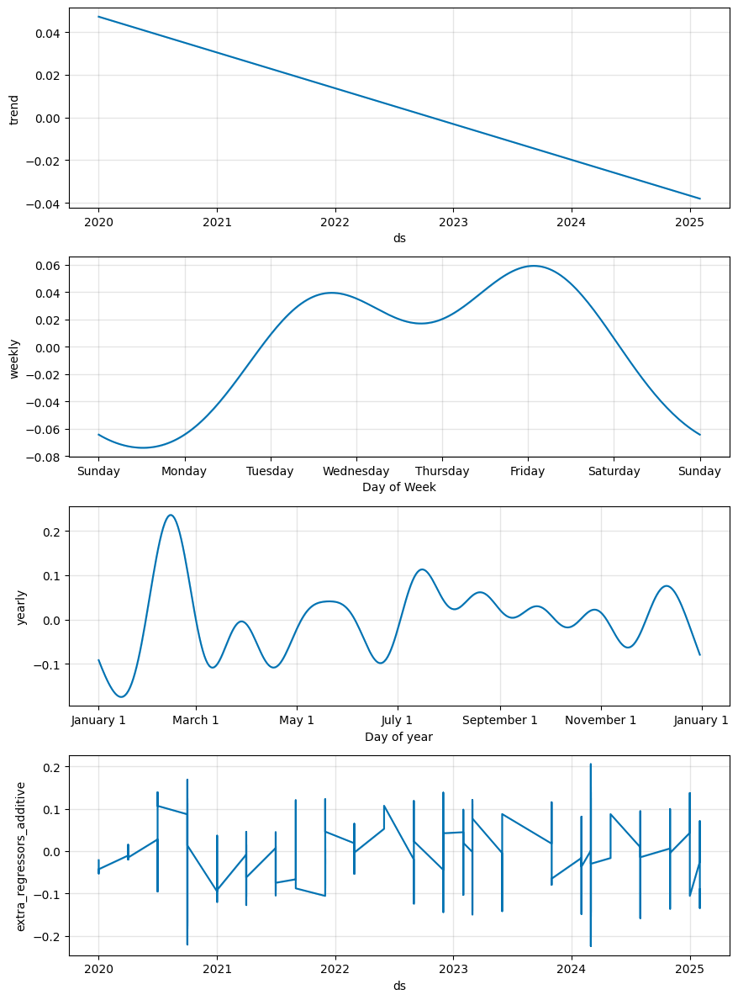

16:45:05 - cmdstanpy - INFO - Chain [1] start processing
16:45:05 - cmdstanpy - INFO - Chain [1] done processing


Model Metrics:
RMSE: 0.1601
MAE: 0.1189

Model with Original Scores:


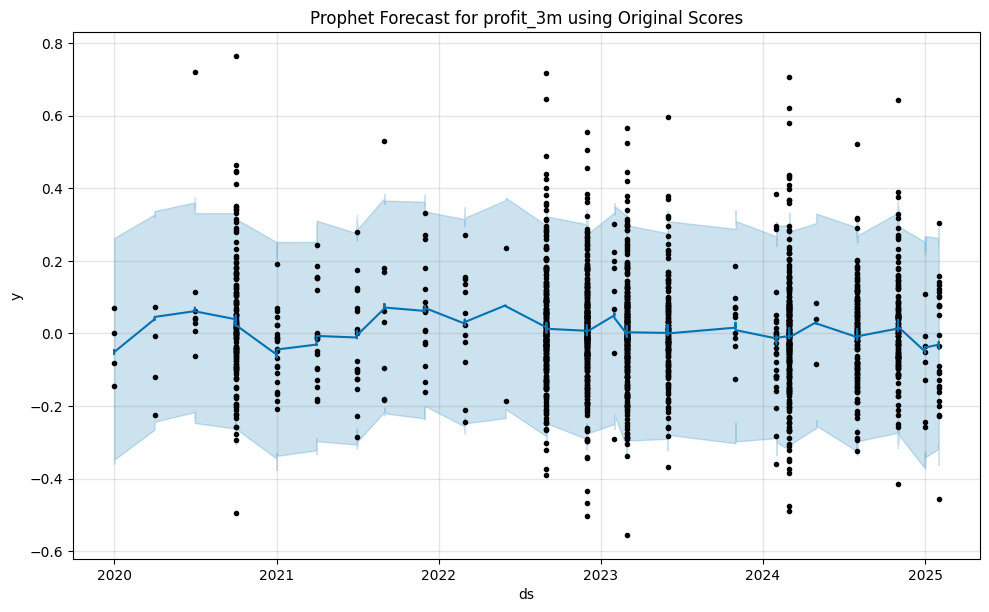

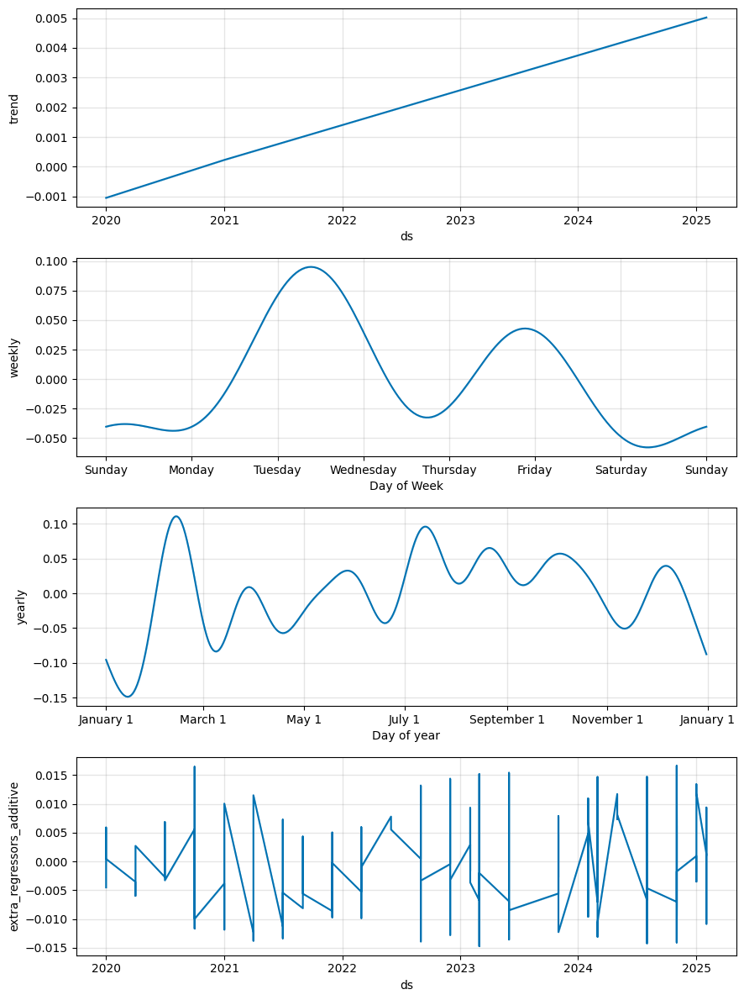

16:45:06 - cmdstanpy - INFO - Chain [1] start processing


Model Metrics:
RMSE: 0.1511
MAE: 0.1100

Comparison for profit_3m:
------------------------------
PCA Variables:
RMSE: 0.1601
MAE: 0.1189

Original Scores:
RMSE: 0.1511
MAE: 0.1100


Prophet Analysis for profit_6m
------------------------------

Model with PCA Variables:


16:45:06 - cmdstanpy - INFO - Chain [1] done processing


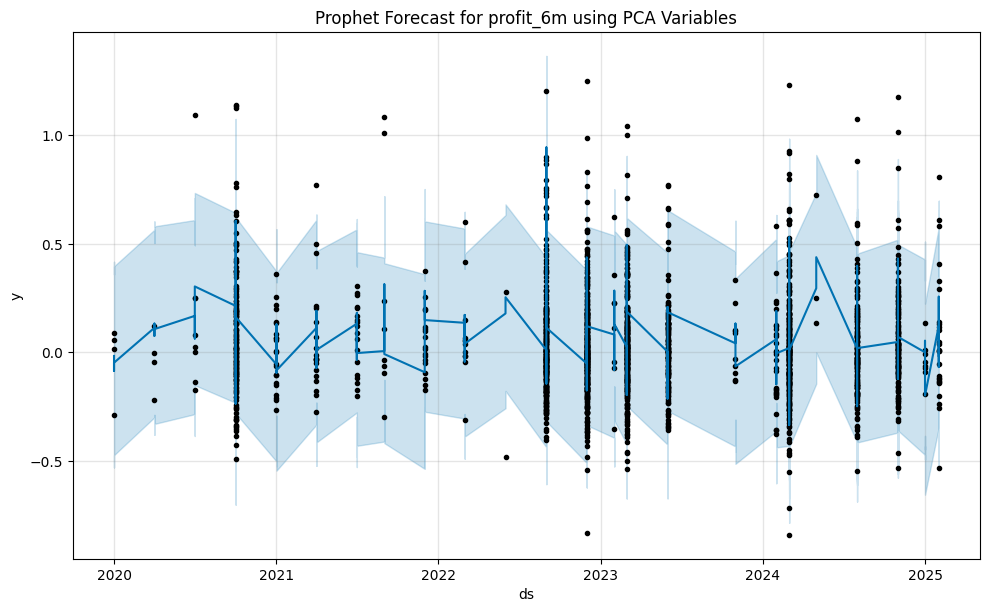

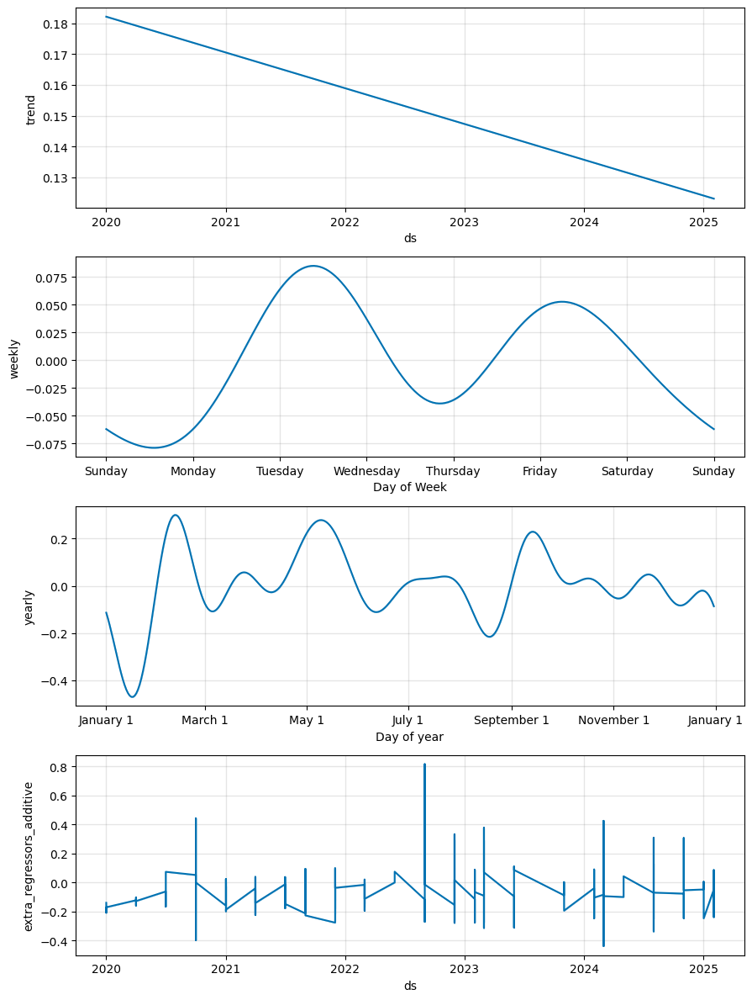

16:45:07 - cmdstanpy - INFO - Chain [1] start processing
16:45:07 - cmdstanpy - INFO - Chain [1] done processing


Model Metrics:
RMSE: 0.2580
MAE: 0.1903

Model with Original Scores:


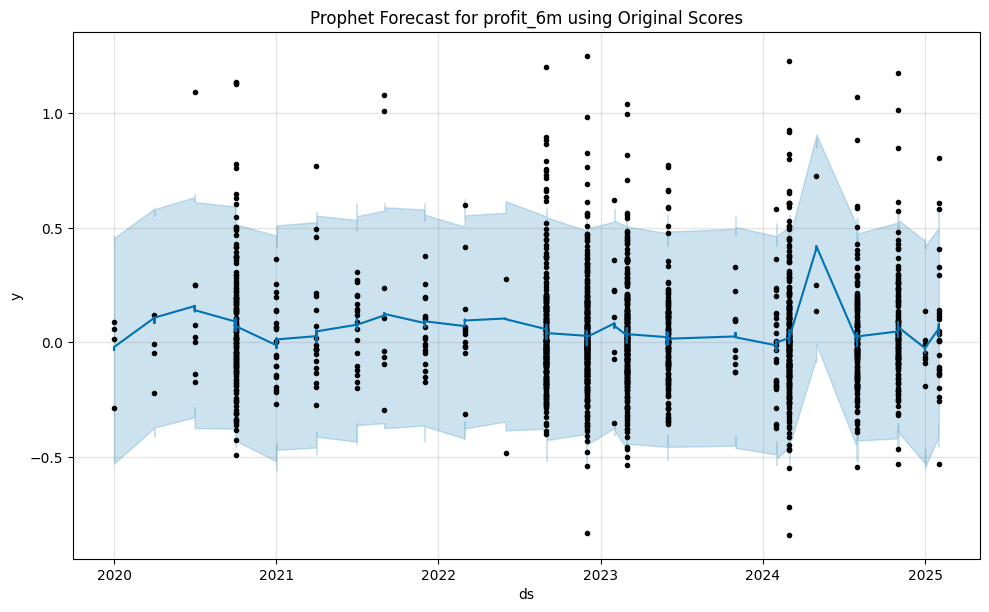

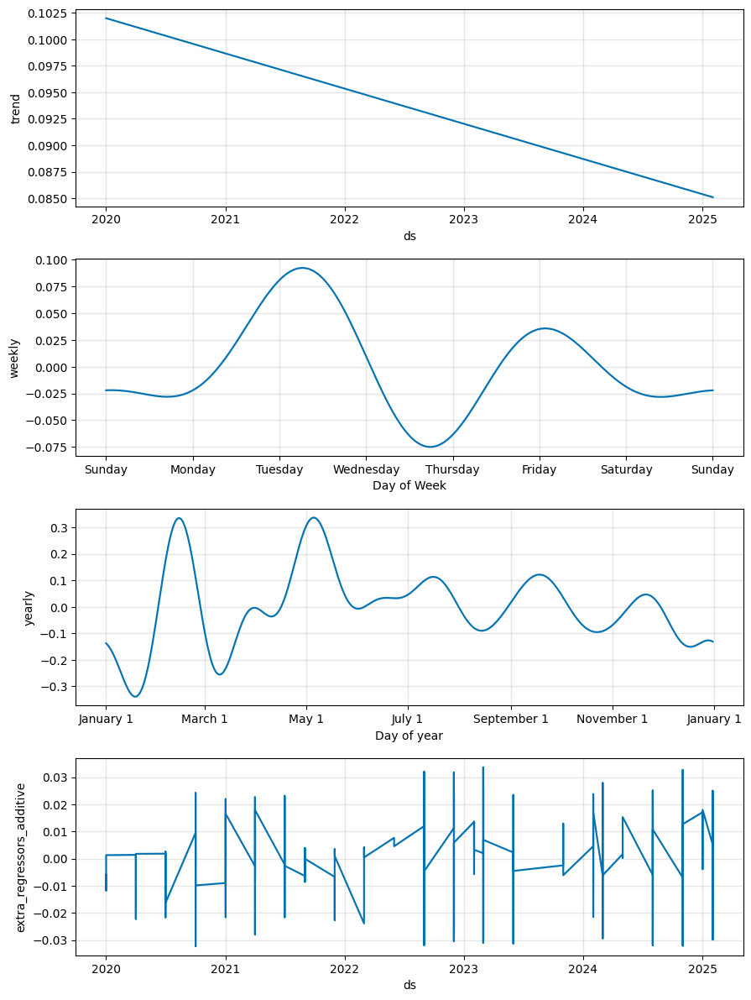

16:45:08 - cmdstanpy - INFO - Chain [1] start processing


Model Metrics:
RMSE: 0.2432
MAE: 0.1774

Comparison for profit_6m:
------------------------------
PCA Variables:
RMSE: 0.2580
MAE: 0.1903

Original Scores:
RMSE: 0.2432
MAE: 0.1774


Prophet Analysis for profit_1y
------------------------------

Model with PCA Variables:


16:45:08 - cmdstanpy - INFO - Chain [1] done processing


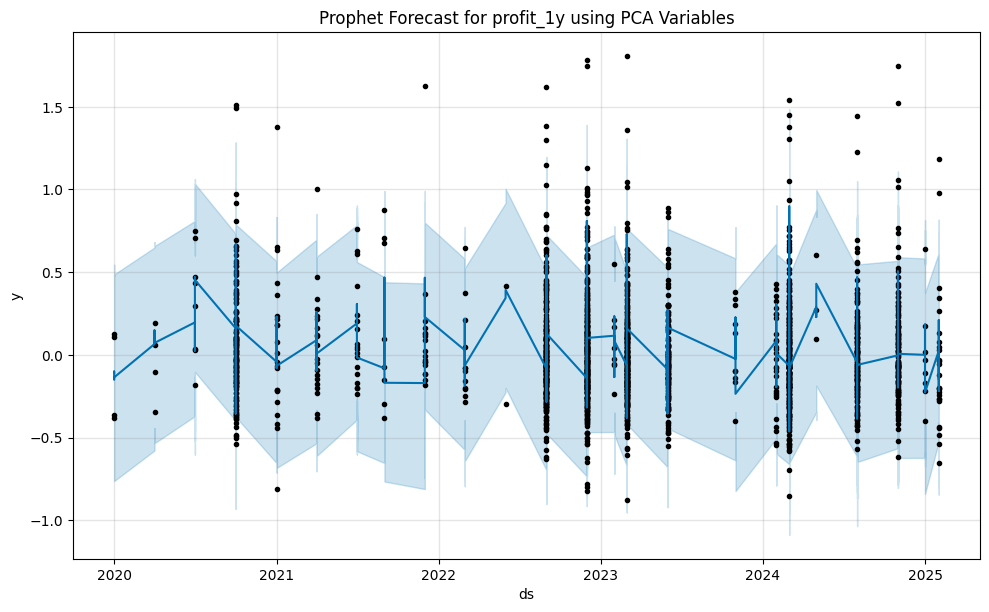

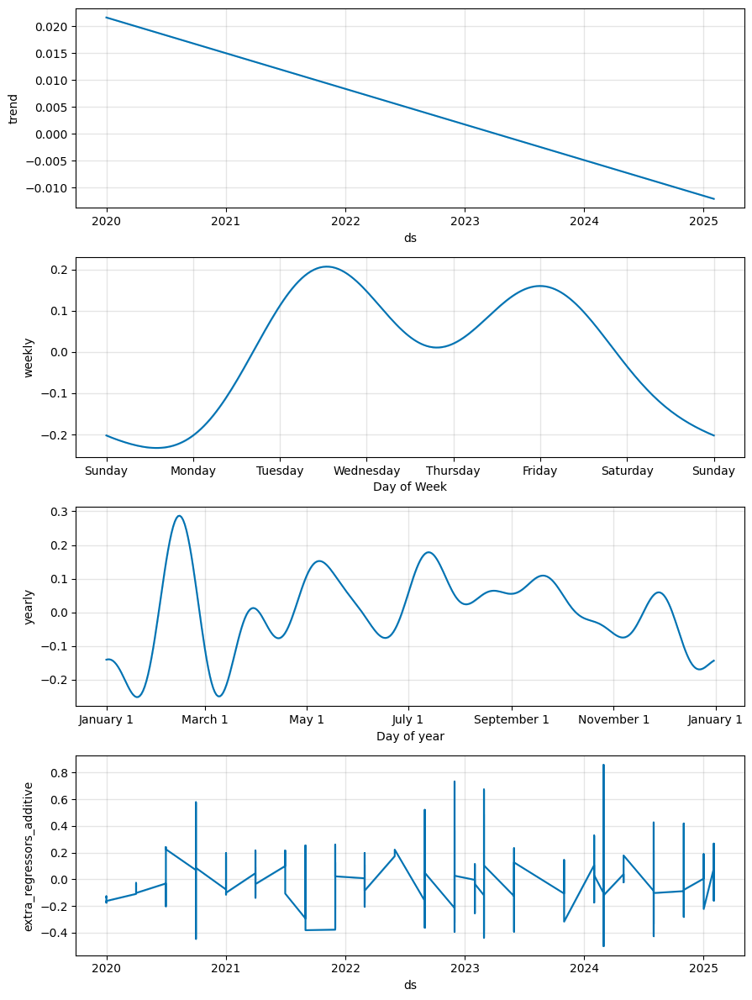

16:45:10 - cmdstanpy - INFO - Chain [1] start processing


Model Metrics:
RMSE: 0.3483
MAE: 0.2612

Model with Original Scores:


16:45:10 - cmdstanpy - INFO - Chain [1] done processing


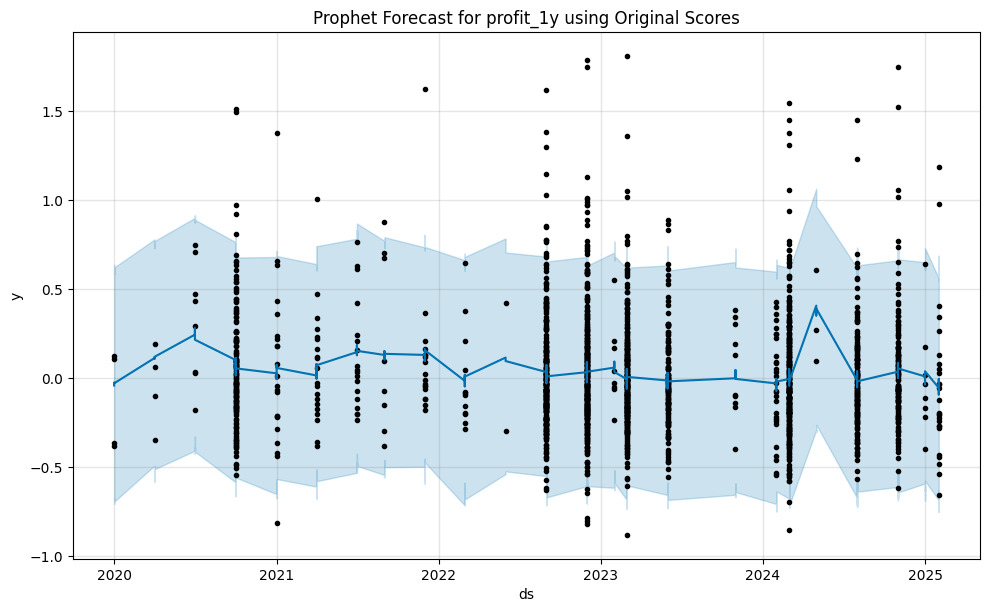

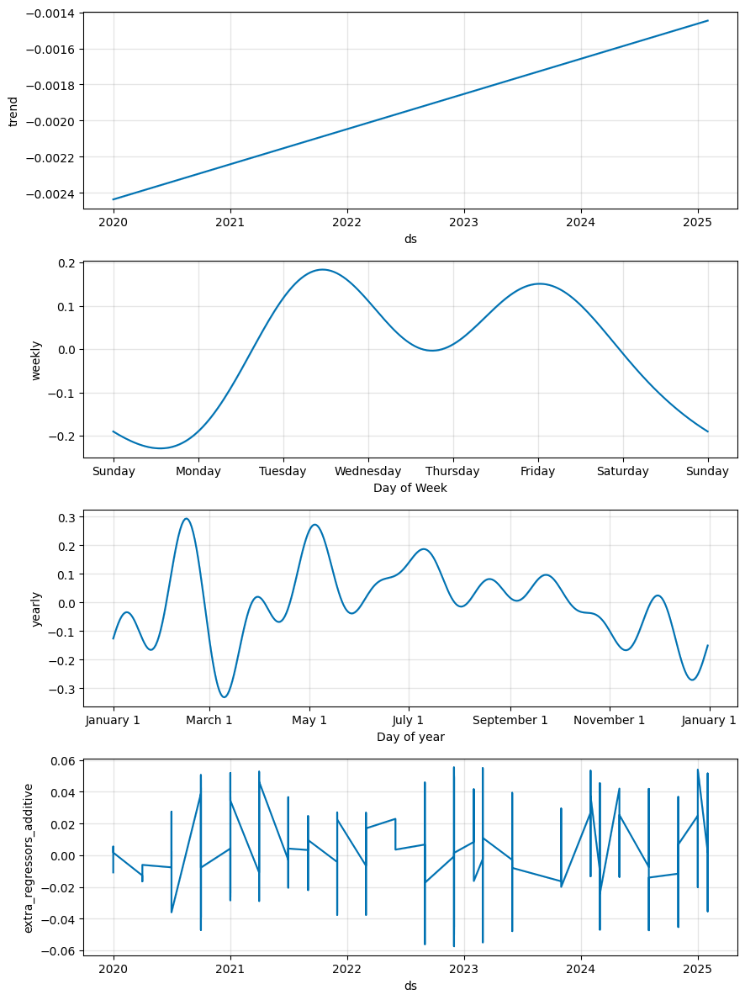

16:45:11 - cmdstanpy - INFO - Chain [1] start processing


Model Metrics:
RMSE: 0.3271
MAE: 0.2415

Comparison for profit_1y:
------------------------------
PCA Variables:
RMSE: 0.3483
MAE: 0.2612

Original Scores:
RMSE: 0.3271
MAE: 0.2415


Prophet Analysis for profit_2y
------------------------------

Model with PCA Variables:


16:45:11 - cmdstanpy - INFO - Chain [1] done processing


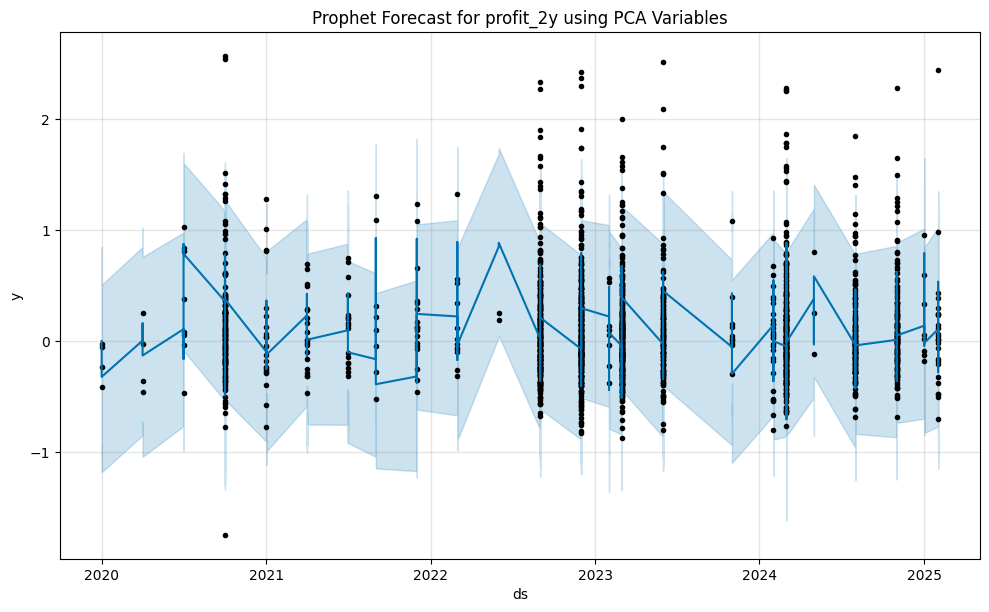

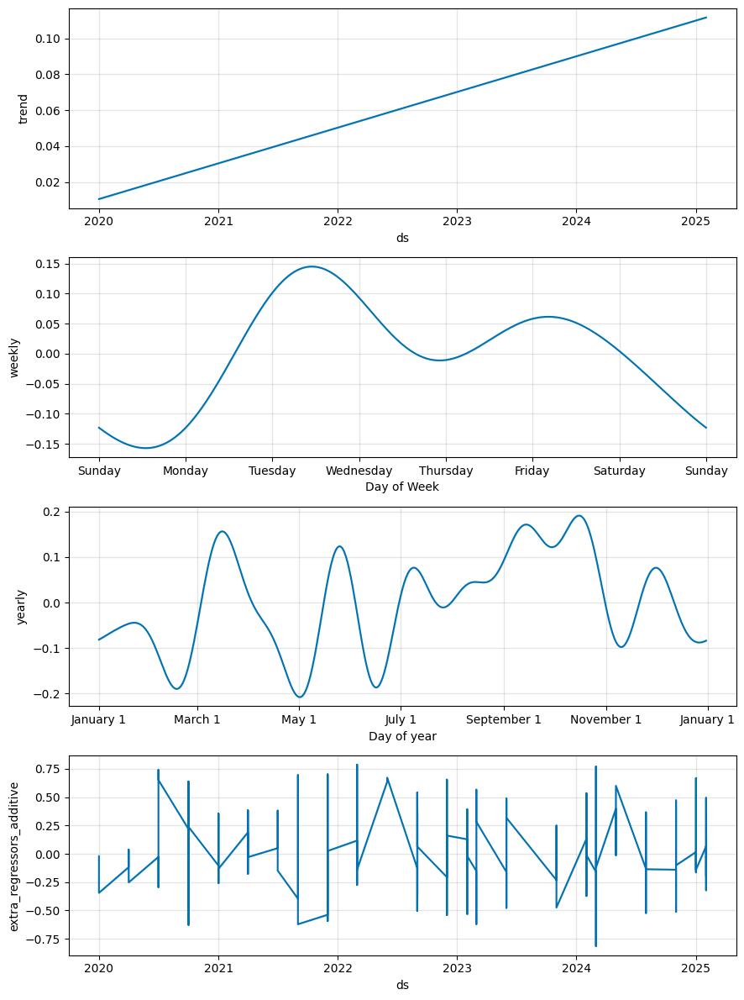

16:45:12 - cmdstanpy - INFO - Chain [1] start processing
16:45:12 - cmdstanpy - INFO - Chain [1] done processing


Model Metrics:
RMSE: 0.5157
MAE: 0.3728

Model with Original Scores:


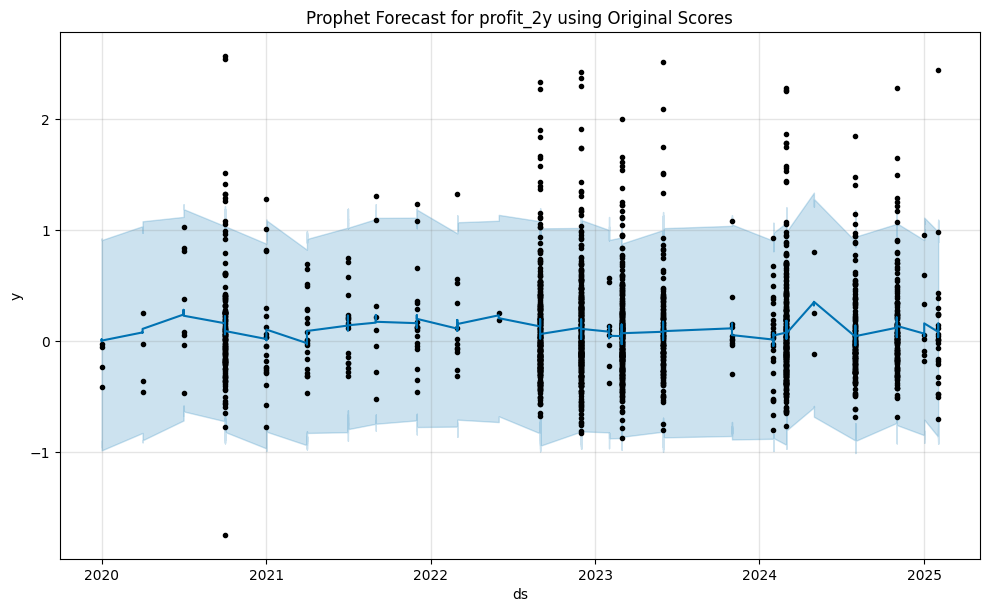

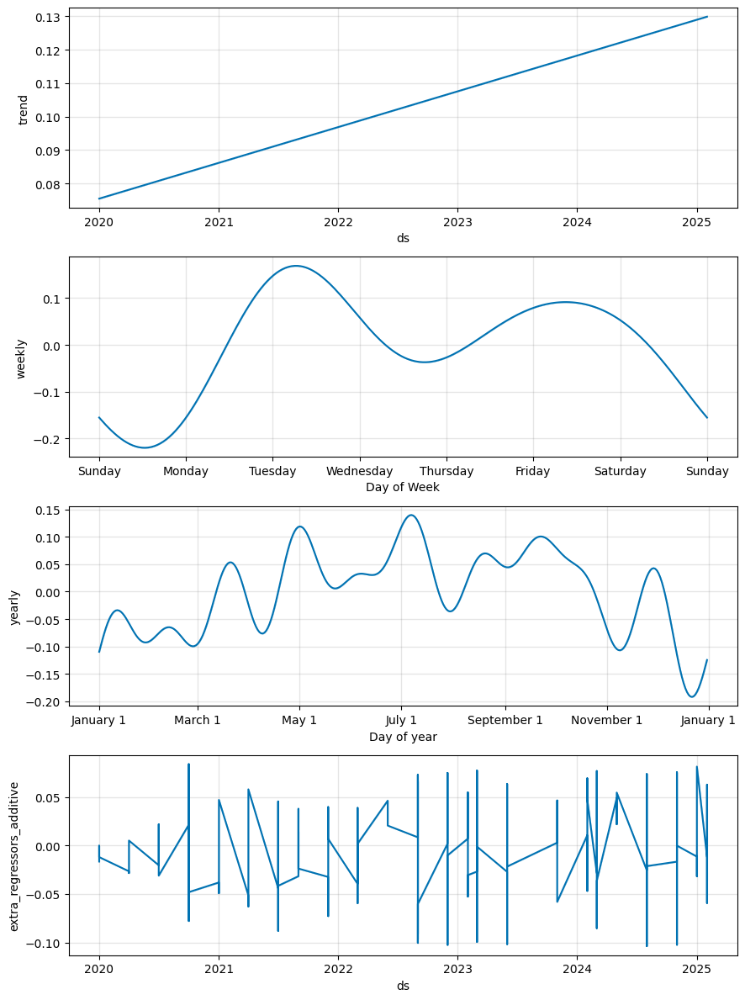

16:45:13 - cmdstanpy - INFO - Chain [1] start processing


Model Metrics:
RMSE: 0.4857
MAE: 0.3459

Comparison for profit_2y:
------------------------------
PCA Variables:
RMSE: 0.5157
MAE: 0.3728

Original Scores:
RMSE: 0.4857
MAE: 0.3459


Prophet Analysis for profit_5y
------------------------------

Model with PCA Variables:


16:45:13 - cmdstanpy - INFO - Chain [1] done processing


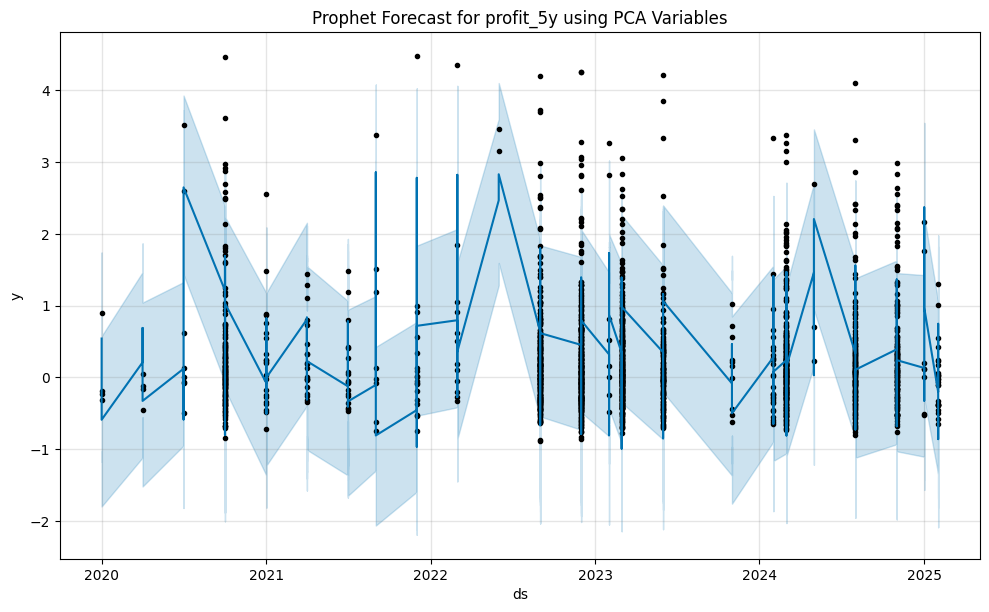

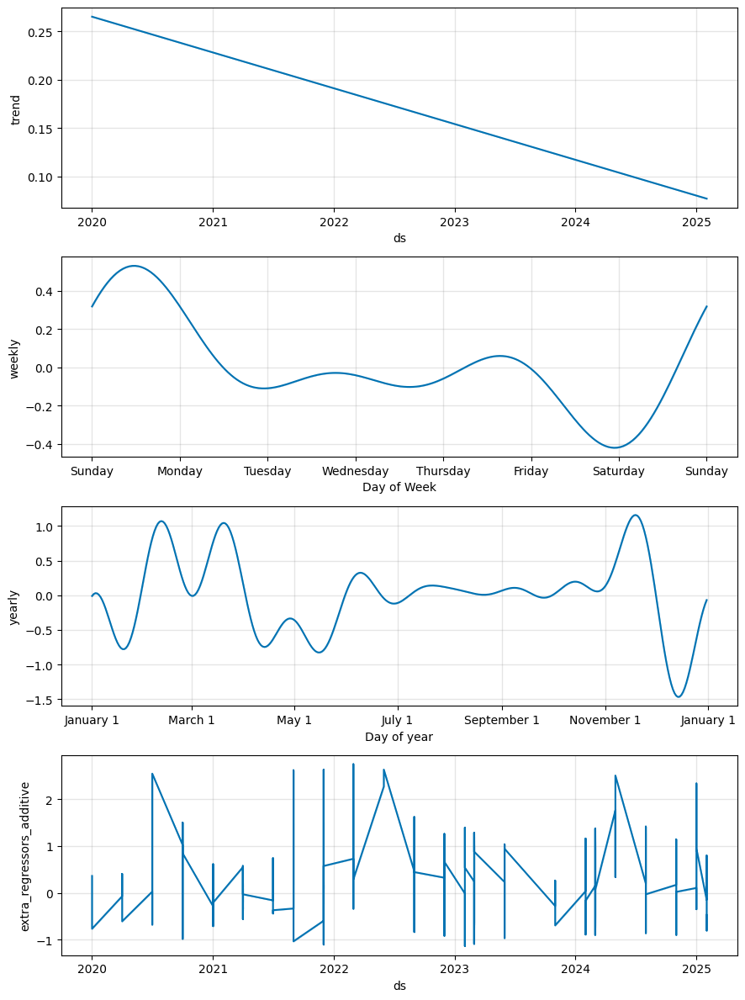

16:45:14 - cmdstanpy - INFO - Chain [1] start processing
16:45:14 - cmdstanpy - INFO - Chain [1] done processing


Model Metrics:
RMSE: 0.8983
MAE: 0.6510

Model with Original Scores:


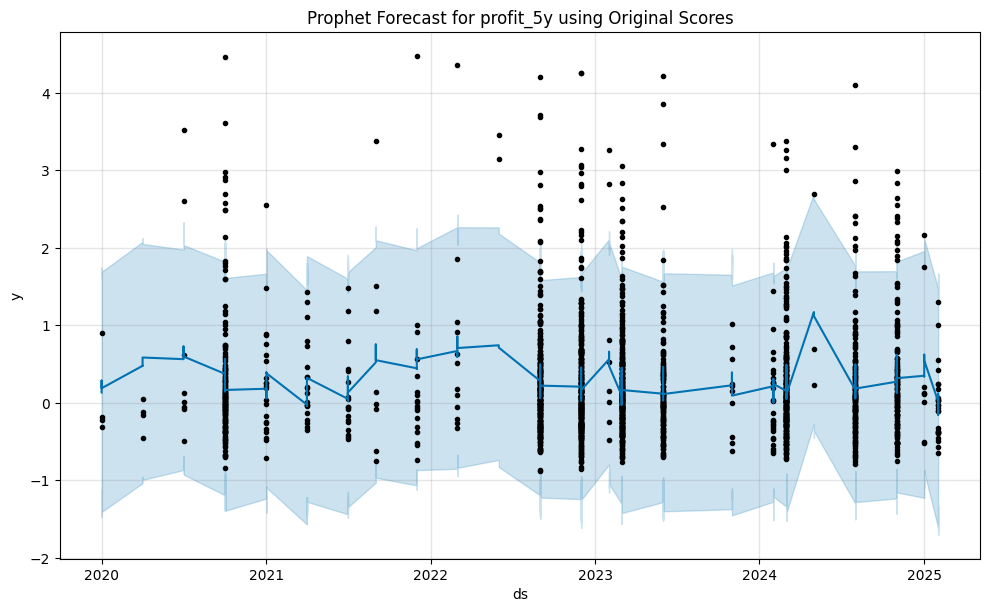

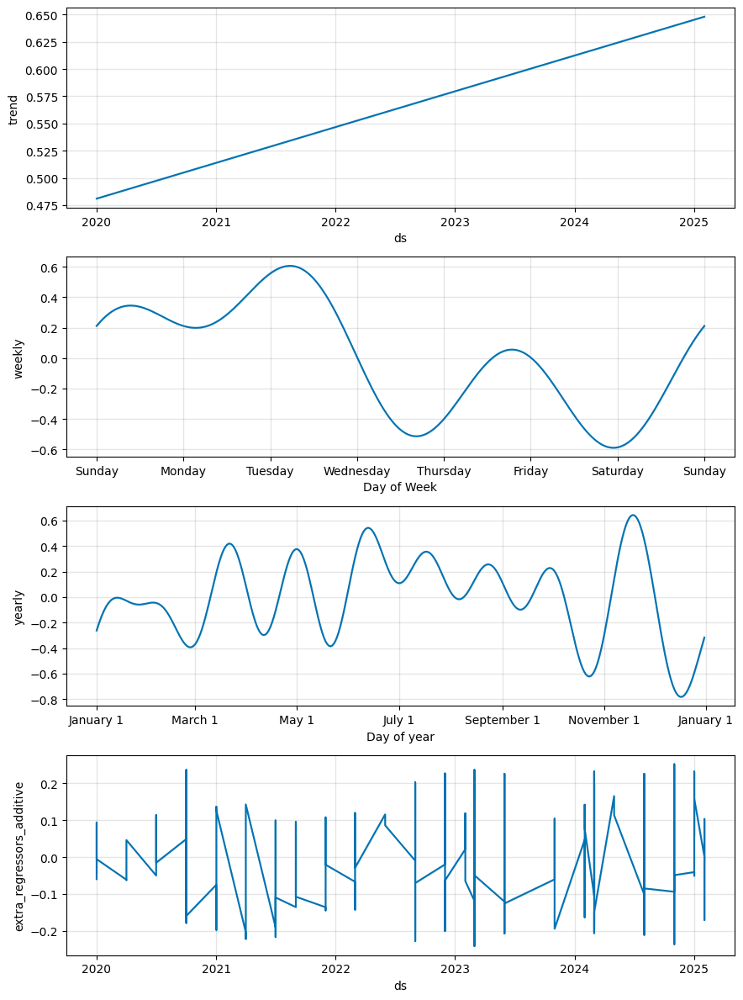

Model Metrics:
RMSE: 0.7967
MAE: 0.5536

Comparison for profit_5y:
------------------------------
PCA Variables:
RMSE: 0.8983
MAE: 0.6510

Original Scores:
RMSE: 0.7967
MAE: 0.5536



In [13]:
# Import Prophet
from prophet import Prophet
import pandas as pd

# Checking df format
# assert df.shape[0] == df_pca.shape[0]
print("shapes:", df.shape, df_pca.shape)

df_pca["date"] = df["date"]
print(df_pca.head())

# Drop nan values
df_pca = df_pca.dropna()

# Define original score columns
original_scores = ["quality", "value", "growth", "dividend"]

print("Prophet Analysis")
print("-" * 50)

for target in profit_targets:
    print(f"\nProphet Analysis for {target}")
    print("-" * 30)

    results = []

    # Run two models - one with PCA variables, one with original scores
    for model_type, features in [
        ("PCA Variables", exog_vars_with_dummies),
        ("Original Scores", df[original_scores]),
    ]:
        try:
            print(f"\nModel with {model_type}:")

            # Prepare data in Prophet format
            prophet_df = pd.DataFrame({"ds": df_pca["date"], "y": df_pca[target]})

            # Add features as additional regressors
            for col in features.columns:
                prophet_df[col] = features[col]

            # Initialize and fit Prophet model
            model = Prophet(
                yearly_seasonality=True,
                weekly_seasonality=True,
                daily_seasonality=False,
                interval_width=0.95,
            )

            # Add features as regressors
            for col in features.columns:
                model.add_regressor(col)

            model.fit(prophet_df)

            # Make predictions on the training set
            forecast = model.predict(prophet_df)

            # Plot the results
            fig = model.plot(forecast)
            plt.title(f"Prophet Forecast for {target} using {model_type}")
            plt.show()

            # Plot components
            fig = model.plot_components(forecast)
            plt.show()

            # Calculate metrics
            mse = np.mean((forecast["yhat"] - prophet_df["y"]) ** 2)
            rmse = np.sqrt(mse)
            mae = np.mean(np.abs(forecast["yhat"] - prophet_df["y"]))

            results.append({"model": model_type, "rmse": rmse, "mae": mae})

            print(f"Model Metrics:")
            print(f"RMSE: {rmse:.4f}")
            print(f"MAE: {mae:.4f}")

        except Exception as e:
            print(
                f"Error fitting Prophet model for {target} with {model_type}: {str(e)}"
            )

    # Compare results
    print(f"\nComparison for {target}:")
    print("-" * 30)
    for result in results:
        print(f"{result['model']}:")
        print(f"RMSE: {result['rmse']:.4f}")
        print(f"MAE: {result['mae']:.4f}")
        print()